# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.997

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9978, 0.9955383357591927)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: wpq2ek1s
Name: wobbly-wind-129
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/wpq2ek1s
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120419-wpq2ek1s/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2583,3268,9392
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2583,2535,1690,3458,1638,3339
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4454,10789
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 622,841,2347
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 622,667,418,832,411,860
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1130,2680
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:15<2:32:44, 15.30s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:15<2:32:44, 15.30s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=28.9]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:15<2:32:44, 15.30s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=28.9]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:29<2:25:14, 14.57s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=28.9]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:29<2:25:14, 14.57s/it, v_num=1s_1, total_loss_train=13.5, kl_local_train=40]

Epoch 3/600:   0%|▌                                                                                                                                                             | 2/600 [00:29<2:25:14, 14.57s/it, v_num=1s_1, total_loss_train=13.5, kl_local_train=40]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:43<2:22:46, 14.35s/it, v_num=1s_1, total_loss_train=13.5, kl_local_train=40]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:43<2:22:46, 14.35s/it, v_num=1s_1, total_loss_train=11.1, kl_local_train=34]

Epoch 4/600:   0%|▊                                                                                                                                                             | 3/600 [00:43<2:22:46, 14.35s/it, v_num=1s_1, total_loss_train=11.1, kl_local_train=34]

Epoch 4/600:   1%|█                                                                                                                                                             | 4/600 [00:57<2:21:21, 14.23s/it, v_num=1s_1, total_loss_train=11.1, kl_local_train=34]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:57<2:21:21, 14.23s/it, v_num=1s_1, total_loss_train=10.5, kl_local_train=23.1]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:57<2:21:21, 14.23s/it, v_num=1s_1, total_loss_train=10.5, kl_local_train=23.1]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:11<2:20:38, 14.18s/it, v_num=1s_1, total_loss_train=10.5, kl_local_train=23.1]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:11<2:20:38, 14.18s/it, v_num=1s_1, total_loss_train=10.2, kl_local_train=14.1]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:12<2:20:38, 14.18s/it, v_num=1s_1, total_loss_train=10.2, kl_local_train=14.1]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:26<2:22:00, 14.34s/it, v_num=1s_1, total_loss_train=10.2, kl_local_train=14.1]

Epoch 6/600:   1%|▎                        | 6/600 [01:26<2:22:00, 14.34s/it, v_num=1s_1, total_loss_train=9.9, kl_local_train=10.6, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|▎                        | 6/600 [01:26<2:22:00, 14.34s/it, v_num=1s_1, total_loss_train=9.9, kl_local_train=10.6, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|▎                        | 7/600 [01:39<2:18:33, 14.02s/it, v_num=1s_1, total_loss_train=9.9, kl_local_train=10.6, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 7/600:   1%|▎                       | 7/600 [01:39<2:18:33, 14.02s/it, v_num=1s_1, total_loss_train=9.71, kl_local_train=10.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|▎                       | 7/600 [01:39<2:18:33, 14.02s/it, v_num=1s_1, total_loss_train=9.71, kl_local_train=10.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|▎                       | 8/600 [01:52<2:16:13, 13.81s/it, v_num=1s_1, total_loss_train=9.71, kl_local_train=10.2, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 8/600:   1%|▎                       | 8/600 [01:52<2:16:13, 13.81s/it, v_num=1s_1, total_loss_train=17.4, kl_local_train=8.68, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 9/600:   1%|▎                       | 8/600 [01:52<2:16:13, 13.81s/it, v_num=1s_1, total_loss_train=17.4, kl_local_train=8.68, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 9/600:   2%|▎                       | 9/600 [02:06<2:14:34, 13.66s/it, v_num=1s_1, total_loss_train=17.4, kl_local_train=8.68, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 9/600:   2%|▎                       | 9/600 [02:06<2:14:34, 13.66s/it, v_num=1s_1, total_loss_train=24.2, kl_local_train=26.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▎                      | 9/600 [02:06<2:14:34, 13.66s/it, v_num=1s_1, total_loss_train=24.2, kl_local_train=26.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▎                     | 10/600 [02:19<2:13:54, 13.62s/it, v_num=1s_1, total_loss_train=24.2, kl_local_train=26.9, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 10/600:   2%|▎                     | 10/600 [02:19<2:13:54, 13.62s/it, v_num=1s_1, total_loss_train=27.2, kl_local_train=71.5, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 11/600:   2%|▎                     | 10/600 [02:21<2:13:54, 13.62s/it, v_num=1s_1, total_loss_train=27.2, kl_local_train=71.5, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 11/600:   2%|▍                     | 11/600 [02:34<2:16:48, 13.94s/it, v_num=1s_1, total_loss_train=27.2, kl_local_train=71.5, metric_mi|status_control_train=0.0208, metric_mi|zone_train=0.00974, metric_mi|time_cat_train=0.0142, metric_mi|mouse_train=0.0363]

Epoch 11/600:   2%|▍                        | 11/600 [02:34<2:16:48, 13.94s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=77.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 12/600:   2%|▍                        | 11/600 [02:34<2:16:48, 13.94s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=77.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 12/600:   2%|▌                        | 12/600 [02:47<2:14:50, 13.76s/it, v_num=1s_1, total_loss_train=31.6, kl_local_train=77.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 12/600:   2%|▌                        | 12/600 [02:47<2:14:50, 13.76s/it, v_num=1s_1, total_loss_train=35.2, kl_local_train=98.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 13/600:   2%|▌                        | 12/600 [02:47<2:14:50, 13.76s/it, v_num=1s_1, total_loss_train=35.2, kl_local_train=98.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 13/600:   2%|▌                        | 13/600 [03:01<2:13:26, 13.64s/it, v_num=1s_1, total_loss_train=35.2, kl_local_train=98.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 13/600:   2%|▌                         | 13/600 [03:01<2:13:26, 13.64s/it, v_num=1s_1, total_loss_train=39.2, kl_local_train=117, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 14/600:   2%|▌                         | 13/600 [03:01<2:13:26, 13.64s/it, v_num=1s_1, total_loss_train=39.2, kl_local_train=117, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 14/600:   2%|▌                         | 14/600 [03:14<2:12:22, 13.55s/it, v_num=1s_1, total_loss_train=39.2, kl_local_train=117, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 14/600:   2%|▌                         | 14/600 [03:14<2:12:22, 13.55s/it, v_num=1s_1, total_loss_train=43.4, kl_local_train=126, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 15/600:   2%|▌                         | 14/600 [03:14<2:12:22, 13.55s/it, v_num=1s_1, total_loss_train=43.4, kl_local_train=126, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 15/600:   2%|▋                         | 15/600 [03:28<2:12:17, 13.57s/it, v_num=1s_1, total_loss_train=43.4, kl_local_train=126, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 15/600:   2%|▋                         | 15/600 [03:28<2:12:17, 13.57s/it, v_num=1s_1, total_loss_train=47.4, kl_local_train=131, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 16/600:   2%|▋                         | 15/600 [03:29<2:12:17, 13.57s/it, v_num=1s_1, total_loss_train=47.4, kl_local_train=131, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 16/600:   3%|▋                         | 16/600 [03:42<2:15:16, 13.90s/it, v_num=1s_1, total_loss_train=47.4, kl_local_train=131, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.0657, metric_mi|mouse_train=0.0684]

Epoch 16/600:   3%|▋                           | 16/600 [03:42<2:15:16, 13.90s/it, v_num=1s_1, total_loss_train=51.5, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 17/600:   3%|▋                           | 16/600 [03:42<2:15:16, 13.90s/it, v_num=1s_1, total_loss_train=51.5, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 17/600:   3%|▊                           | 17/600 [03:56<2:13:37, 13.75s/it, v_num=1s_1, total_loss_train=51.5, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 17/600:   3%|▊                           | 17/600 [03:56<2:13:37, 13.75s/it, v_num=1s_1, total_loss_train=55.7, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 18/600:   3%|▊                           | 17/600 [03:56<2:13:37, 13.75s/it, v_num=1s_1, total_loss_train=55.7, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 18/600:   3%|▊                           | 18/600 [04:09<2:12:35, 13.67s/it, v_num=1s_1, total_loss_train=55.7, kl_local_train=131, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 18/600:   3%|▊                           | 18/600 [04:09<2:12:35, 13.67s/it, v_num=1s_1, total_loss_train=59.9, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 19/600:   3%|▊                           | 18/600 [04:09<2:12:35, 13.67s/it, v_num=1s_1, total_loss_train=59.9, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 19/600:   3%|▉                           | 19/600 [04:23<2:11:56, 13.62s/it, v_num=1s_1, total_loss_train=59.9, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 19/600:   3%|▉                           | 19/600 [04:23<2:11:56, 13.62s/it, v_num=1s_1, total_loss_train=64.1, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 20/600:   3%|▉                           | 19/600 [04:23<2:11:56, 13.62s/it, v_num=1s_1, total_loss_train=64.1, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 20/600:   3%|▉                           | 20/600 [04:36<2:11:24, 13.59s/it, v_num=1s_1, total_loss_train=64.1, kl_local_train=132, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 20/600:   3%|▉                           | 20/600 [04:36<2:11:24, 13.59s/it, v_num=1s_1, total_loss_train=68.3, kl_local_train=134, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 21/600:   3%|▉                           | 20/600 [04:38<2:11:24, 13.59s/it, v_num=1s_1, total_loss_train=68.3, kl_local_train=134, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 21/600:   4%|▉                           | 21/600 [04:51<2:14:29, 13.94s/it, v_num=1s_1, total_loss_train=68.3, kl_local_train=134, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 21/600:   4%|█                            | 21/600 [04:51<2:14:29, 13.94s/it, v_num=1s_1, total_loss_train=72.5, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                            | 21/600 [04:51<2:14:29, 13.94s/it, v_num=1s_1, total_loss_train=72.5, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                            | 22/600 [05:04<2:12:51, 13.79s/it, v_num=1s_1, total_loss_train=72.5, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 22/600:   4%|█                            | 22/600 [05:04<2:12:51, 13.79s/it, v_num=1s_1, total_loss_train=76.6, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                            | 22/600 [05:04<2:12:51, 13.79s/it, v_num=1s_1, total_loss_train=76.6, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█                            | 23/600 [05:17<2:09:37, 13.48s/it, v_num=1s_1, total_loss_train=76.6, kl_local_train=135, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 23/600:   4%|█▏                             | 23/600 [05:17<2:09:37, 13.48s/it, v_num=1s_1, total_loss_train=81, kl_local_train=138, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█▏                             | 23/600 [05:17<2:09:37, 13.48s/it, v_num=1s_1, total_loss_train=81, kl_local_train=138, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█▏                             | 24/600 [05:28<2:02:57, 12.81s/it, v_num=1s_1, total_loss_train=81, kl_local_train=138, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 24/600:   4%|█▏                           | 24/600 [05:28<2:02:57, 12.81s/it, v_num=1s_1, total_loss_train=85.1, kl_local_train=139, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▏                           | 24/600 [05:28<2:02:57, 12.81s/it, v_num=1s_1, total_loss_train=85.1, kl_local_train=139, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▏                           | 25/600 [05:40<1:58:26, 12.36s/it, v_num=1s_1, total_loss_train=85.1, kl_local_train=139, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 25/600:   4%|█▏                           | 25/600 [05:40<1:58:26, 12.36s/it, v_num=1s_1, total_loss_train=89.5, kl_local_train=137, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▏                           | 25/600 [05:41<1:58:26, 12.36s/it, v_num=1s_1, total_loss_train=89.5, kl_local_train=137, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▎                           | 26/600 [05:52<1:58:42, 12.41s/it, v_num=1s_1, total_loss_train=89.5, kl_local_train=137, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.136]

Epoch 26/600:   4%|█▏                          | 26/600 [05:52<1:58:42, 12.41s/it, v_num=1s_1, total_loss_train=93.7, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▏                          | 26/600 [05:52<1:58:42, 12.41s/it, v_num=1s_1, total_loss_train=93.7, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▎                          | 27/600 [06:04<1:55:14, 12.07s/it, v_num=1s_1, total_loss_train=93.7, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 27/600:   4%|█▎                            | 27/600 [06:04<1:55:14, 12.07s/it, v_num=1s_1, total_loss_train=98, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   4%|█▎                            | 27/600 [06:04<1:55:14, 12.07s/it, v_num=1s_1, total_loss_train=98, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|█▍                            | 28/600 [06:15<1:52:45, 11.83s/it, v_num=1s_1, total_loss_train=98, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 28/600:   5%|█▎                           | 28/600 [06:15<1:52:45, 11.83s/it, v_num=1s_1, total_loss_train=102, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▎                           | 28/600 [06:15<1:52:45, 11.83s/it, v_num=1s_1, total_loss_train=102, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▍                           | 29/600 [06:26<1:50:59, 11.66s/it, v_num=1s_1, total_loss_train=102, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 29/600:   5%|█▍                           | 29/600 [06:26<1:50:59, 11.66s/it, v_num=1s_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▍                           | 29/600 [06:26<1:50:59, 11.66s/it, v_num=1s_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▍                           | 30/600 [06:37<1:49:45, 11.55s/it, v_num=1s_1, total_loss_train=106, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 30/600:   5%|█▍                           | 30/600 [06:37<1:49:45, 11.55s/it, v_num=1s_1, total_loss_train=111, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▍                           | 30/600 [06:39<1:49:45, 11.55s/it, v_num=1s_1, total_loss_train=111, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▍                           | 31/600 [06:50<1:52:25, 11.86s/it, v_num=1s_1, total_loss_train=111, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 31/600:   5%|█▌                            | 31/600 [06:50<1:52:25, 11.86s/it, v_num=1s_1, total_loss_train=115, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 32/600:   5%|█▌                            | 31/600 [06:50<1:52:25, 11.86s/it, v_num=1s_1, total_loss_train=115, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 32/600:   5%|█▌                            | 32/600 [07:01<1:50:39, 11.69s/it, v_num=1s_1, total_loss_train=115, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 32/600:   5%|█▌                            | 32/600 [07:01<1:50:39, 11.69s/it, v_num=1s_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 33/600:   5%|█▌                            | 32/600 [07:01<1:50:39, 11.69s/it, v_num=1s_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 33/600:   6%|█▋                            | 33/600 [07:13<1:49:18, 11.57s/it, v_num=1s_1, total_loss_train=119, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 33/600:   6%|█▋                            | 33/600 [07:13<1:49:18, 11.57s/it, v_num=1s_1, total_loss_train=123, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 34/600:   6%|█▋                            | 33/600 [07:13<1:49:18, 11.57s/it, v_num=1s_1, total_loss_train=123, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 34/600:   6%|█▋                            | 34/600 [07:24<1:48:19, 11.48s/it, v_num=1s_1, total_loss_train=123, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 34/600:   6%|█▋                            | 34/600 [07:24<1:48:19, 11.48s/it, v_num=1s_1, total_loss_train=128, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 35/600:   6%|█▋                            | 34/600 [07:24<1:48:19, 11.48s/it, v_num=1s_1, total_loss_train=128, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 35/600:   6%|█▊                            | 35/600 [07:35<1:47:38, 11.43s/it, v_num=1s_1, total_loss_train=128, kl_local_train=141, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 35/600:   6%|█▊                            | 35/600 [07:35<1:47:38, 11.43s/it, v_num=1s_1, total_loss_train=132, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 36/600:   6%|█▊                            | 35/600 [07:36<1:47:38, 11.43s/it, v_num=1s_1, total_loss_train=132, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 36/600:   6%|█▊                            | 36/600 [07:48<1:50:40, 11.77s/it, v_num=1s_1, total_loss_train=132, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.133]

Epoch 36/600:   6%|█▋                           | 36/600 [07:48<1:50:40, 11.77s/it, v_num=1s_1, total_loss_train=136, kl_local_train=141, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 37/600:   6%|█▋                           | 36/600 [07:48<1:50:40, 11.77s/it, v_num=1s_1, total_loss_train=136, kl_local_train=141, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 37/600:   6%|█▊                           | 37/600 [07:59<1:49:15, 11.64s/it, v_num=1s_1, total_loss_train=136, kl_local_train=141, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 37/600:   6%|█▊                           | 37/600 [07:59<1:49:15, 11.64s/it, v_num=1s_1, total_loss_train=141, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 38/600:   6%|█▊                           | 37/600 [07:59<1:49:15, 11.64s/it, v_num=1s_1, total_loss_train=141, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 38/600:   6%|█▊                           | 38/600 [08:10<1:48:13, 11.55s/it, v_num=1s_1, total_loss_train=141, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 38/600:   6%|█▊                           | 38/600 [08:10<1:48:13, 11.55s/it, v_num=1s_1, total_loss_train=145, kl_local_train=145, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 39/600:   6%|█▊                           | 38/600 [08:10<1:48:13, 11.55s/it, v_num=1s_1, total_loss_train=145, kl_local_train=145, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 39/600:   6%|█▉                           | 39/600 [08:22<1:47:29, 11.50s/it, v_num=1s_1, total_loss_train=145, kl_local_train=145, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 39/600:   6%|█▉                           | 39/600 [08:22<1:47:29, 11.50s/it, v_num=1s_1, total_loss_train=149, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 40/600:   6%|█▉                           | 39/600 [08:22<1:47:29, 11.50s/it, v_num=1s_1, total_loss_train=149, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 40/600:   7%|█▉                           | 40/600 [08:33<1:47:01, 11.47s/it, v_num=1s_1, total_loss_train=149, kl_local_train=143, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 40/600:   7%|█▉                           | 40/600 [08:33<1:47:01, 11.47s/it, v_num=1s_1, total_loss_train=153, kl_local_train=142, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 41/600:   7%|█▉                           | 40/600 [08:34<1:47:01, 11.47s/it, v_num=1s_1, total_loss_train=153, kl_local_train=142, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 41/600:   7%|█▉                           | 41/600 [08:46<1:50:02, 11.81s/it, v_num=1s_1, total_loss_train=153, kl_local_train=142, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 41/600:   7%|██                             | 41/600 [08:46<1:50:02, 11.81s/it, v_num=1s_1, total_loss_train=158, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 42/600:   7%|██                             | 41/600 [08:46<1:50:02, 11.81s/it, v_num=1s_1, total_loss_train=158, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 42/600:   7%|██▏                            | 42/600 [08:57<1:48:41, 11.69s/it, v_num=1s_1, total_loss_train=158, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 42/600:   7%|██▏                            | 42/600 [08:57<1:48:41, 11.69s/it, v_num=1s_1, total_loss_train=162, kl_local_train=146, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 43/600:   7%|██▏                            | 42/600 [08:57<1:48:41, 11.69s/it, v_num=1s_1, total_loss_train=162, kl_local_train=146, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 43/600:   7%|██▏                            | 43/600 [09:09<1:47:53, 11.62s/it, v_num=1s_1, total_loss_train=162, kl_local_train=146, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 43/600:   7%|██▏                            | 43/600 [09:09<1:47:53, 11.62s/it, v_num=1s_1, total_loss_train=166, kl_local_train=144, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 44/600:   7%|██▏                            | 43/600 [09:09<1:47:53, 11.62s/it, v_num=1s_1, total_loss_train=166, kl_local_train=144, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 44/600:   7%|██▎                            | 44/600 [09:20<1:47:13, 11.57s/it, v_num=1s_1, total_loss_train=166, kl_local_train=144, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 44/600:   7%|██▎                            | 44/600 [09:20<1:47:13, 11.57s/it, v_num=1s_1, total_loss_train=171, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 45/600:   7%|██▎                            | 44/600 [09:20<1:47:13, 11.57s/it, v_num=1s_1, total_loss_train=171, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 45/600:   8%|██▎                            | 45/600 [09:31<1:46:36, 11.53s/it, v_num=1s_1, total_loss_train=171, kl_local_train=145, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 45/600:   8%|██▎                            | 45/600 [09:32<1:46:36, 11.53s/it, v_num=1s_1, total_loss_train=174, kl_local_train=147, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 46/600:   8%|██▎                            | 45/600 [09:33<1:46:36, 11.53s/it, v_num=1s_1, total_loss_train=174, kl_local_train=147, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 46/600:   8%|██▍                            | 46/600 [09:44<1:49:40, 11.88s/it, v_num=1s_1, total_loss_train=174, kl_local_train=147, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 46/600:   8%|██▎                           | 46/600 [09:44<1:49:40, 11.88s/it, v_num=1s_1, total_loss_train=179, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 47/600:   8%|██▎                           | 46/600 [09:44<1:49:40, 11.88s/it, v_num=1s_1, total_loss_train=179, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 47/600:   8%|██▎                           | 47/600 [09:56<1:48:11, 11.74s/it, v_num=1s_1, total_loss_train=179, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 47/600:   8%|██▎                           | 47/600 [09:56<1:48:11, 11.74s/it, v_num=1s_1, total_loss_train=183, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 48/600:   8%|██▎                           | 47/600 [09:56<1:48:11, 11.74s/it, v_num=1s_1, total_loss_train=183, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 48/600:   8%|██▍                           | 48/600 [10:07<1:47:17, 11.66s/it, v_num=1s_1, total_loss_train=183, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 48/600:   8%|██▍                           | 48/600 [10:07<1:47:17, 11.66s/it, v_num=1s_1, total_loss_train=187, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 49/600:   8%|██▍                           | 48/600 [10:07<1:47:17, 11.66s/it, v_num=1s_1, total_loss_train=187, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 49/600:   8%|██▍                           | 49/600 [10:19<1:46:45, 11.62s/it, v_num=1s_1, total_loss_train=187, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 49/600:   8%|██▍                           | 49/600 [10:19<1:46:45, 11.62s/it, v_num=1s_1, total_loss_train=192, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 50/600:   8%|██▍                           | 49/600 [10:19<1:46:45, 11.62s/it, v_num=1s_1, total_loss_train=192, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 50/600:   8%|██▌                           | 50/600 [10:30<1:45:53, 11.55s/it, v_num=1s_1, total_loss_train=192, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 50/600:   8%|██▌                           | 50/600 [10:30<1:45:53, 11.55s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 51/600:   8%|██▌                           | 50/600 [10:31<1:45:53, 11.55s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 51/600:   8%|██▌                           | 51/600 [10:43<1:48:38, 11.87s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 51/600:   8%|██▌                           | 51/600 [10:43<1:48:38, 11.87s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 52/600:   8%|██▌                           | 51/600 [10:43<1:48:38, 11.87s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 52/600:   9%|██▌                           | 52/600 [10:54<1:47:08, 11.73s/it, v_num=1s_1, total_loss_train=196, kl_local_train=149, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 52/600:   9%|██▌                           | 52/600 [10:54<1:47:08, 11.73s/it, v_num=1s_1, total_loss_train=196, kl_local_train=150, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|██▌                           | 52/600 [10:54<1:47:08, 11.73s/it, v_num=1s_1, total_loss_train=196, kl_local_train=150, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|██▋                           | 53/600 [11:05<1:46:02, 11.63s/it, v_num=1s_1, total_loss_train=196, kl_local_train=150, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 53/600:   9%|██▋                           | 53/600 [11:05<1:46:02, 11.63s/it, v_num=1s_1, total_loss_train=196, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|██▋                           | 53/600 [11:05<1:46:02, 11.63s/it, v_num=1s_1, total_loss_train=196, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|██▋                           | 54/600 [11:17<1:45:13, 11.56s/it, v_num=1s_1, total_loss_train=196, kl_local_train=148, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 54/600:   9%|██▋                           | 54/600 [11:17<1:45:13, 11.56s/it, v_num=1s_1, total_loss_train=197, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|██▋                           | 54/600 [11:17<1:45:13, 11.56s/it, v_num=1s_1, total_loss_train=197, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|██▊                           | 55/600 [11:28<1:44:44, 11.53s/it, v_num=1s_1, total_loss_train=197, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 55/600:   9%|██▊                           | 55/600 [11:28<1:44:44, 11.53s/it, v_num=1s_1, total_loss_train=196, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|██▊                           | 55/600 [11:30<1:44:44, 11.53s/it, v_num=1s_1, total_loss_train=196, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|██▊                           | 56/600 [11:41<1:47:47, 11.89s/it, v_num=1s_1, total_loss_train=196, kl_local_train=145, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 56/600:   9%|██▊                           | 56/600 [11:41<1:47:47, 11.89s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▊                           | 56/600 [11:41<1:47:47, 11.89s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [11:53<1:46:33, 11.77s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                           | 57/600 [11:53<1:46:33, 11.77s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                           | 57/600 [11:53<1:46:33, 11.77s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [12:04<1:45:36, 11.69s/it, v_num=1s_1, total_loss_train=197, kl_local_train=144, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▉                           | 58/600 [12:04<1:45:36, 11.69s/it, v_num=1s_1, total_loss_train=197, kl_local_train=141, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 58/600 [12:04<1:45:36, 11.69s/it, v_num=1s_1, total_loss_train=197, kl_local_train=141, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [12:15<1:44:50, 11.63s/it, v_num=1s_1, total_loss_train=197, kl_local_train=141, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▉                           | 59/600 [12:16<1:44:50, 11.63s/it, v_num=1s_1, total_loss_train=197, kl_local_train=139, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                           | 59/600 [12:16<1:44:50, 11.63s/it, v_num=1s_1, total_loss_train=197, kl_local_train=139, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [12:27<1:44:25, 11.60s/it, v_num=1s_1, total_loss_train=197, kl_local_train=139, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|███                           | 60/600 [12:27<1:44:25, 11.60s/it, v_num=1s_1, total_loss_train=197, kl_local_train=140, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 60/600 [12:28<1:44:25, 11.60s/it, v_num=1s_1, total_loss_train=197, kl_local_train=140, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███                           | 61/600 [12:40<1:47:17, 11.94s/it, v_num=1s_1, total_loss_train=197, kl_local_train=140, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|███▎                            | 61/600 [12:40<1:47:17, 11.94s/it, v_num=1s_1, total_loss_train=197, kl_local_train=138, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 62/600:  10%|███▎                            | 61/600 [12:40<1:47:17, 11.94s/it, v_num=1s_1, total_loss_train=197, kl_local_train=138, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 62/600:  10%|███▎                            | 62/600 [12:51<1:45:58, 11.82s/it, v_num=1s_1, total_loss_train=197, kl_local_train=138, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 62/600:  10%|███▎                            | 62/600 [12:51<1:45:58, 11.82s/it, v_num=1s_1, total_loss_train=197, kl_local_train=137, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 63/600:  10%|███▎                            | 62/600 [12:51<1:45:58, 11.82s/it, v_num=1s_1, total_loss_train=197, kl_local_train=137, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 63/600:  10%|███▎                            | 63/600 [13:03<1:44:54, 11.72s/it, v_num=1s_1, total_loss_train=197, kl_local_train=137, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 63/600:  10%|███▎                            | 63/600 [13:03<1:44:54, 11.72s/it, v_num=1s_1, total_loss_train=197, kl_local_train=136, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 64/600:  10%|███▎                            | 63/600 [13:03<1:44:54, 11.72s/it, v_num=1s_1, total_loss_train=197, kl_local_train=136, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 64/600:  11%|███▍                            | 64/600 [13:14<1:44:08, 11.66s/it, v_num=1s_1, total_loss_train=197, kl_local_train=136, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 64/600:  11%|███▍                            | 64/600 [13:14<1:44:08, 11.66s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 65/600:  11%|███▍                            | 64/600 [13:14<1:44:08, 11.66s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 65/600:  11%|███▍                            | 65/600 [13:26<1:44:35, 11.73s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 65/600:  11%|███▍                            | 65/600 [13:26<1:44:35, 11.73s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 66/600:  11%|███▍                            | 65/600 [13:27<1:44:35, 11.73s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 66/600:  11%|███▌                            | 66/600 [13:39<1:47:06, 12.03s/it, v_num=1s_1, total_loss_train=198, kl_local_train=135, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 66/600:  11%|███▏                         | 66/600 [13:39<1:47:06, 12.03s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▏                         | 66/600 [13:39<1:47:06, 12.03s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▏                         | 67/600 [13:51<1:45:36, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▏                         | 67/600 [13:51<1:45:36, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▏                         | 67/600 [13:51<1:45:36, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▎                         | 68/600 [14:02<1:44:26, 11.78s/it, v_num=1s_1, total_loss_train=198, kl_local_train=134, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▎                         | 68/600 [14:02<1:44:26, 11.78s/it, v_num=1s_1, total_loss_train=198, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  11%|███▎                         | 68/600 [14:02<1:44:26, 11.78s/it, v_num=1s_1, total_loss_train=198, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  12%|███▎                         | 69/600 [14:14<1:43:38, 11.71s/it, v_num=1s_1, total_loss_train=198, kl_local_train=132, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  12%|███▎                         | 69/600 [14:14<1:43:38, 11.71s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▎                         | 69/600 [14:14<1:43:38, 11.71s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▍                         | 70/600 [14:25<1:42:59, 11.66s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▍                         | 70/600 [14:25<1:42:59, 11.66s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▍                         | 70/600 [14:26<1:42:59, 11.66s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▍                         | 71/600 [14:38<1:45:48, 12.00s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▍                         | 71/600 [14:38<1:45:48, 12.00s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 71/600 [14:38<1:45:48, 12.00s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 72/600 [14:50<1:44:37, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=130, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 72/600:  12%|███▍                         | 72/600 [14:50<1:44:37, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▍                         | 72/600 [14:50<1:44:37, 11.89s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▌                         | 73/600 [15:01<1:43:28, 11.78s/it, v_num=1s_1, total_loss_train=198, kl_local_train=129, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 73/600:  12%|███▌                         | 73/600 [15:01<1:43:28, 11.78s/it, v_num=1s_1, total_loss_train=199, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 73/600 [15:01<1:43:28, 11.78s/it, v_num=1s_1, total_loss_train=199, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 74/600 [15:13<1:42:41, 11.71s/it, v_num=1s_1, total_loss_train=199, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 74/600:  12%|███▌                         | 74/600 [15:13<1:42:41, 11.71s/it, v_num=1s_1, total_loss_train=199, kl_local_train=127, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▌                         | 74/600 [15:13<1:42:41, 11.71s/it, v_num=1s_1, total_loss_train=199, kl_local_train=127, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▋                         | 75/600 [15:24<1:42:23, 11.70s/it, v_num=1s_1, total_loss_train=199, kl_local_train=127, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 75/600:  12%|███▋                         | 75/600 [15:24<1:42:23, 11.70s/it, v_num=1s_1, total_loss_train=198, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  12%|███▋                         | 75/600 [15:26<1:42:23, 11.70s/it, v_num=1s_1, total_loss_train=198, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  13%|███▋                         | 76/600 [15:37<1:45:02, 12.03s/it, v_num=1s_1, total_loss_train=198, kl_local_train=126, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 76/600:  13%|███▊                          | 76/600 [15:37<1:45:02, 12.03s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 76/600 [15:37<1:45:02, 12.03s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 77/600 [15:49<1:43:35, 11.88s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 77/600 [15:49<1:43:35, 11.88s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▊                          | 77/600 [15:49<1:43:35, 11.88s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▉                          | 78/600 [16:00<1:42:30, 11.78s/it, v_num=1s_1, total_loss_train=199, kl_local_train=125, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▉                          | 78/600 [16:00<1:42:30, 11.78s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 78/600 [16:00<1:42:30, 11.78s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 79/600 [16:12<1:41:36, 11.70s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 79/600 [16:12<1:41:36, 11.70s/it, v_num=1s_1, total_loss_train=199, kl_local_train=123, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|███▉                          | 79/600 [16:12<1:41:36, 11.70s/it, v_num=1s_1, total_loss_train=199, kl_local_train=123, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|████                          | 80/600 [16:23<1:41:07, 11.67s/it, v_num=1s_1, total_loss_train=199, kl_local_train=123, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|████                          | 80/600 [16:23<1:41:07, 11.67s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  13%|████                          | 80/600 [16:25<1:41:07, 11.67s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|████                          | 81/600 [16:36<1:43:46, 12.00s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.248, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|████                          | 81/600 [16:36<1:43:46, 12.00s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 81/600 [16:36<1:43:46, 12.00s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 82/600 [16:48<1:42:25, 11.86s/it, v_num=1s_1, total_loss_train=199, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|████                          | 82/600 [16:48<1:42:25, 11.86s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████                          | 82/600 [16:48<1:42:25, 11.86s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████▏                         | 83/600 [16:59<1:41:20, 11.76s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████▏                         | 83/600 [16:59<1:41:20, 11.76s/it, v_num=1s_1, total_loss_train=200, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 83/600 [16:59<1:41:20, 11.76s/it, v_num=1s_1, total_loss_train=200, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 84/600 [17:11<1:40:33, 11.69s/it, v_num=1s_1, total_loss_train=200, kl_local_train=122, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████▏                         | 84/600 [17:11<1:40:33, 11.69s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▏                         | 84/600 [17:11<1:40:33, 11.69s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▎                         | 85/600 [17:22<1:39:49, 11.63s/it, v_num=1s_1, total_loss_train=200, kl_local_train=121, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████▎                         | 85/600 [17:22<1:39:49, 11.63s/it, v_num=1s_1, total_loss_train=200, kl_local_train=120, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▎                         | 85/600 [17:23<1:39:49, 11.63s/it, v_num=1s_1, total_loss_train=200, kl_local_train=120, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▎                         | 86/600 [17:35<1:42:31, 11.97s/it, v_num=1s_1, total_loss_train=200, kl_local_train=120, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▏                        | 86/600 [17:35<1:42:31, 11.97s/it, v_num=1s_1, total_loss_train=200, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▏                        | 86/600 [17:35<1:42:31, 11.97s/it, v_num=1s_1, total_loss_train=200, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▏                        | 87/600 [17:46<1:41:11, 11.84s/it, v_num=1s_1, total_loss_train=200, kl_local_train=119, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 87/600:  14%|████▏                        | 87/600 [17:46<1:41:11, 11.84s/it, v_num=1s_1, total_loss_train=200, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 88/600:  14%|████▏                        | 87/600 [17:46<1:41:11, 11.84s/it, v_num=1s_1, total_loss_train=200, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 88/600:  15%|████▎                        | 88/600 [17:58<1:40:11, 11.74s/it, v_num=1s_1, total_loss_train=200, kl_local_train=118, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 88/600:  15%|████▎                        | 88/600 [17:58<1:40:11, 11.74s/it, v_num=1s_1, total_loss_train=200, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▎                        | 88/600 [17:58<1:40:11, 11.74s/it, v_num=1s_1, total_loss_train=200, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▎                        | 89/600 [18:09<1:39:26, 11.68s/it, v_num=1s_1, total_loss_train=200, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 89/600:  15%|████▎                        | 89/600 [18:09<1:39:26, 11.68s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▎                        | 89/600 [18:09<1:39:26, 11.68s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▎                        | 90/600 [18:21<1:38:44, 11.62s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 90/600:  15%|████▎                        | 90/600 [18:21<1:38:44, 11.62s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▎                        | 90/600 [18:22<1:38:44, 11.62s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▍                        | 91/600 [18:34<1:41:27, 11.96s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 91/600:  15%|████▍                        | 91/600 [18:34<1:41:27, 11.96s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 91/600 [18:34<1:41:27, 11.96s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [18:45<1:40:10, 11.83s/it, v_num=1s_1, total_loss_train=201, kl_local_train=117, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [18:45<1:40:10, 11.83s/it, v_num=1s_1, total_loss_train=201, kl_local_train=116, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  15%|████▍                        | 92/600 [18:45<1:40:10, 11.83s/it, v_num=1s_1, total_loss_train=201, kl_local_train=116, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [18:57<1:39:13, 11.74s/it, v_num=1s_1, total_loss_train=201, kl_local_train=116, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [18:57<1:39:13, 11.74s/it, v_num=1s_1, total_loss_train=201, kl_local_train=114, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▍                        | 93/600 [18:57<1:39:13, 11.74s/it, v_num=1s_1, total_loss_train=201, kl_local_train=114, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [19:08<1:38:31, 11.68s/it, v_num=1s_1, total_loss_train=201, kl_local_train=114, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [19:08<1:38:31, 11.68s/it, v_num=1s_1, total_loss_train=201, kl_local_train=115, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 94/600 [19:08<1:38:31, 11.68s/it, v_num=1s_1, total_loss_train=201, kl_local_train=115, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:20<1:37:55, 11.63s/it, v_num=1s_1, total_loss_train=201, kl_local_train=115, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:20<1:37:55, 11.63s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▌                        | 95/600 [19:21<1:37:55, 11.63s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▋                        | 96/600 [19:33<1:40:33, 11.97s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▋                        | 96/600 [19:33<1:40:33, 11.97s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 97/600:  16%|████▋                        | 96/600 [19:33<1:40:33, 11.97s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 97/600:  16%|████▋                        | 97/600 [19:44<1:39:23, 11.86s/it, v_num=1s_1, total_loss_train=201, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 97/600:  16%|████▋                        | 97/600 [19:44<1:39:23, 11.86s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 98/600:  16%|████▋                        | 97/600 [19:44<1:39:23, 11.86s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 98/600:  16%|████▋                        | 98/600 [19:56<1:38:24, 11.76s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 98/600:  16%|████▋                        | 98/600 [19:56<1:38:24, 11.76s/it, v_num=1s_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 99/600:  16%|████▋                        | 98/600 [19:56<1:38:24, 11.76s/it, v_num=1s_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 99/600:  16%|████▊                        | 99/600 [20:07<1:37:38, 11.69s/it, v_num=1s_1, total_loss_train=201, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 99/600:  16%|████▊                        | 99/600 [20:07<1:37:38, 11.69s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 100/600:  16%|████▌                       | 99/600 [20:07<1:37:38, 11.69s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 100/600:  17%|████▌                      | 100/600 [20:19<1:37:06, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=112, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 100/600:  17%|████▌                      | 100/600 [20:19<1:37:06, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 101/600:  17%|████▌                      | 100/600 [20:20<1:37:06, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 101/600:  17%|████▌                      | 101/600 [20:32<1:39:50, 12.01s/it, v_num=1s_1, total_loss_train=202, kl_local_train=111, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 101/600:  17%|████▋                       | 101/600 [20:32<1:39:50, 12.01s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▋                       | 101/600 [20:32<1:39:50, 12.01s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▊                       | 102/600 [20:43<1:38:33, 11.87s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 102/600:  17%|████▊                       | 102/600 [20:43<1:38:33, 11.87s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▊                       | 102/600 [20:43<1:38:33, 11.87s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▊                       | 103/600 [20:55<1:37:34, 11.78s/it, v_num=1s_1, total_loss_train=202, kl_local_train=110, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 103/600:  17%|████▊                       | 103/600 [20:55<1:37:34, 11.78s/it, v_num=1s_1, total_loss_train=202, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▊                       | 103/600 [20:55<1:37:34, 11.78s/it, v_num=1s_1, total_loss_train=202, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▊                       | 104/600 [21:06<1:36:45, 11.71s/it, v_num=1s_1, total_loss_train=202, kl_local_train=109, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 104/600:  17%|████▊                       | 104/600 [21:06<1:36:45, 11.71s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 105/600:  17%|████▊                       | 104/600 [21:06<1:36:45, 11.71s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 105/600:  18%|████▉                       | 105/600 [21:18<1:36:08, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 105/600:  18%|████▉                       | 105/600 [21:18<1:36:08, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▉                       | 105/600 [21:19<1:36:08, 11.65s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▉                       | 106/600 [21:31<1:38:48, 12.00s/it, v_num=1s_1, total_loss_train=202, kl_local_train=108, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 106/600:  18%|████▊                      | 106/600 [21:31<1:38:48, 12.00s/it, v_num=1s_1, total_loss_train=203, kl_local_train=108, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 107/600:  18%|████▊                      | 106/600 [21:31<1:38:48, 12.00s/it, v_num=1s_1, total_loss_train=203, kl_local_train=108, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 107/600:  18%|████▊                      | 107/600 [21:42<1:37:36, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=108, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 107/600:  18%|████▊                      | 107/600 [21:42<1:37:36, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 108/600:  18%|████▊                      | 107/600 [21:42<1:37:36, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 108/600:  18%|████▊                      | 108/600 [21:54<1:36:37, 11.78s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 108/600:  18%|████▊                      | 108/600 [21:54<1:36:37, 11.78s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 109/600:  18%|████▊                      | 108/600 [21:54<1:36:37, 11.78s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 109/600:  18%|████▉                      | 109/600 [22:05<1:35:56, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 109/600:  18%|████▉                      | 109/600 [22:05<1:35:56, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 110/600:  18%|████▉                      | 109/600 [22:05<1:35:56, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 110/600:  18%|████▉                      | 110/600 [22:17<1:35:17, 11.67s/it, v_num=1s_1, total_loss_train=203, kl_local_train=107, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 110/600:  18%|████▉                      | 110/600 [22:17<1:35:17, 11.67s/it, v_num=1s_1, total_loss_train=203, kl_local_train=105, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 111/600:  18%|████▉                      | 110/600 [22:18<1:35:17, 11.67s/it, v_num=1s_1, total_loss_train=203, kl_local_train=105, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 111/600:  18%|████▉                      | 111/600 [22:30<1:37:53, 12.01s/it, v_num=1s_1, total_loss_train=203, kl_local_train=105, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 111/600:  18%|█████▎                       | 111/600 [22:30<1:37:53, 12.01s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 112/600:  18%|█████▎                       | 111/600 [22:30<1:37:53, 12.01s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 112/600:  19%|█████▍                       | 112/600 [22:41<1:36:38, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 112/600:  19%|█████▍                       | 112/600 [22:41<1:36:38, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 113/600:  19%|█████▍                       | 112/600 [22:41<1:36:38, 11.88s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 113/600:  19%|█████▍                       | 113/600 [22:53<1:35:39, 11.79s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 113/600:  19%|█████▍                       | 113/600 [22:53<1:35:39, 11.79s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 114/600:  19%|█████▍                       | 113/600 [22:53<1:35:39, 11.79s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 114/600:  19%|█████▌                       | 114/600 [23:04<1:34:55, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=104, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 114/600:  19%|█████▌                       | 114/600 [23:04<1:34:55, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 115/600:  19%|█████▌                       | 114/600 [23:04<1:34:55, 11.72s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 115/600:  19%|█████▌                       | 115/600 [23:16<1:34:12, 11.66s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 115/600:  19%|█████▌                       | 115/600 [23:16<1:34:12, 11.66s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 116/600:  19%|█████▌                       | 115/600 [23:17<1:34:12, 11.66s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 116/600:  19%|█████▌                       | 116/600 [23:29<1:36:41, 11.99s/it, v_num=1s_1, total_loss_train=203, kl_local_train=103, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.144]

Epoch 116/600:  19%|█████▌                       | 116/600 [23:29<1:36:41, 11.99s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 117/600:  19%|█████▌                       | 116/600 [23:29<1:36:41, 11.99s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 117/600:  20%|█████▋                       | 117/600 [23:40<1:35:22, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 117/600:  20%|█████▋                       | 117/600 [23:40<1:35:22, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 118/600:  20%|█████▋                       | 117/600 [23:40<1:35:22, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 118/600:  20%|█████▋                       | 118/600 [23:52<1:34:24, 11.75s/it, v_num=1s_1, total_loss_train=204, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 118/600:  20%|█████▋                       | 118/600 [23:52<1:34:24, 11.75s/it, v_num=1s_1, total_loss_train=204, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 119/600:  20%|█████▋                       | 118/600 [23:52<1:34:24, 11.75s/it, v_num=1s_1, total_loss_train=204, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 119/600:  20%|█████▊                       | 119/600 [24:03<1:33:42, 11.69s/it, v_num=1s_1, total_loss_train=204, kl_local_train=103, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 119/600:  20%|█████▊                       | 119/600 [24:03<1:33:42, 11.69s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 120/600:  20%|█████▊                       | 119/600 [24:03<1:33:42, 11.69s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 120/600:  20%|█████▊                       | 120/600 [24:15<1:32:58, 11.62s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 120/600:  20%|█████▊                       | 120/600 [24:15<1:32:58, 11.62s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 121/600:  20%|█████▊                       | 120/600 [24:16<1:32:58, 11.62s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 121/600:  20%|█████▊                       | 121/600 [24:28<1:35:30, 11.96s/it, v_num=1s_1, total_loss_train=204, kl_local_train=101, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 121/600:  20%|█████▍                     | 121/600 [24:28<1:35:30, 11.96s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▍                     | 121/600 [24:28<1:35:30, 11.96s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▍                     | 122/600 [24:39<1:34:24, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 122/600:  20%|█████▍                     | 122/600 [24:39<1:34:24, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▍                     | 122/600 [24:39<1:34:24, 11.85s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:51<1:33:30, 11.76s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 123/600:  20%|█████▌                     | 123/600 [24:51<1:33:30, 11.76s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  20%|█████▌                     | 123/600 [24:51<1:33:30, 11.76s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  21%|█████▌                     | 124/600 [25:02<1:32:48, 11.70s/it, v_num=1s_1, total_loss_train=204, kl_local_train=100, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 124/600:  21%|█████▊                      | 124/600 [25:02<1:32:48, 11.70s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|█████▊                      | 124/600 [25:02<1:32:48, 11.70s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|█████▊                      | 125/600 [25:14<1:32:15, 11.65s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 125/600:  21%|█████▍                    | 125/600 [25:14<1:32:15, 11.65s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|█████▍                    | 125/600 [25:15<1:32:15, 11.65s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|█████▍                    | 126/600 [25:27<1:35:05, 12.04s/it, v_num=1s_1, total_loss_train=205, kl_local_train=99.6, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 126/600:  21%|█████▍                    | 126/600 [25:27<1:35:05, 12.04s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▍                    | 126/600 [25:27<1:35:05, 12.04s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▌                    | 127/600 [25:38<1:33:44, 11.89s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 127/600:  21%|█████▌                    | 127/600 [25:38<1:33:44, 11.89s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▌                    | 127/600 [25:38<1:33:44, 11.89s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▌                    | 128/600 [25:50<1:32:42, 11.78s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 128/600:  21%|█████▌                    | 128/600 [25:50<1:32:42, 11.78s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 129/600:  21%|█████▌                    | 128/600 [25:50<1:32:42, 11.78s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 129/600:  22%|█████▌                    | 129/600 [26:01<1:31:55, 11.71s/it, v_num=1s_1, total_loss_train=205, kl_local_train=98.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 129/600:  22%|█████▌                    | 129/600 [26:01<1:31:55, 11.71s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▌                    | 129/600 [26:01<1:31:55, 11.71s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▋                    | 130/600 [26:13<1:31:25, 11.67s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.9, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 130/600:  22%|█████▋                    | 130/600 [26:13<1:31:25, 11.67s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|█████▋                    | 130/600 [26:14<1:31:25, 11.67s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|█████▋                    | 131/600 [26:26<1:33:48, 12.00s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 131/600:  22%|█████▉                     | 131/600 [26:26<1:33:48, 12.00s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|█████▉                     | 131/600 [26:26<1:33:48, 12.00s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|█████▉                     | 132/600 [26:37<1:32:33, 11.87s/it, v_num=1s_1, total_loss_train=205, kl_local_train=97.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 132/600:  22%|█████▉                     | 132/600 [26:37<1:32:33, 11.87s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▉                     | 132/600 [26:37<1:32:33, 11.87s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▉                     | 133/600 [26:49<1:31:35, 11.77s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 133/600:  22%|█████▉                     | 133/600 [26:49<1:31:35, 11.77s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|█████▉                     | 133/600 [26:49<1:31:35, 11.77s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|██████                     | 134/600 [27:00<1:30:52, 11.70s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 134/600:  22%|██████                     | 134/600 [27:00<1:30:52, 11.70s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|██████                     | 134/600 [27:00<1:30:52, 11.70s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|██████                     | 135/600 [27:12<1:30:11, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 135/600:  22%|██████                     | 135/600 [27:12<1:30:11, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 136/600:  22%|██████                     | 135/600 [27:13<1:30:11, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 136/600:  23%|██████                     | 136/600 [27:25<1:32:35, 11.97s/it, v_num=1s_1, total_loss_train=206, kl_local_train=95.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 136/600:  23%|█████▉                    | 136/600 [27:25<1:32:35, 11.97s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|█████▉                    | 136/600 [27:25<1:32:35, 11.97s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:36<1:31:21, 11.84s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 137/600:  23%|█████▉                    | 137/600 [27:36<1:31:21, 11.84s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|█████▉                    | 137/600 [27:36<1:31:21, 11.84s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|█████▉                    | 138/600 [27:48<1:30:27, 11.75s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 138/600:  23%|█████▉                    | 138/600 [27:48<1:30:27, 11.75s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|█████▉                    | 138/600 [27:48<1:30:27, 11.75s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|██████                    | 139/600 [27:59<1:29:45, 11.68s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.1, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 139/600:  23%|██████                    | 139/600 [27:59<1:29:45, 11.68s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████                    | 139/600 [27:59<1:29:45, 11.68s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████                    | 140/600 [28:11<1:29:15, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=94.2, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 140/600:  23%|██████                    | 140/600 [28:11<1:29:15, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=93.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 141/600:  23%|██████                    | 140/600 [28:12<1:29:15, 11.64s/it, v_num=1s_1, total_loss_train=206, kl_local_train=93.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 141/600:  24%|██████                    | 141/600 [28:23<1:31:39, 11.98s/it, v_num=1s_1, total_loss_train=206, kl_local_train=93.5, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 141/600:  24%|██████▌                     | 141/600 [28:23<1:31:39, 11.98s/it, v_num=1s_1, total_loss_train=207, kl_local_train=93, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 142/600:  24%|██████▌                     | 141/600 [28:23<1:31:39, 11.98s/it, v_num=1s_1, total_loss_train=207, kl_local_train=93, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 142/600:  24%|██████▋                     | 142/600 [28:35<1:30:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=93, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 142/600:  24%|██████▏                   | 142/600 [28:35<1:30:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 143/600:  24%|██████▏                   | 142/600 [28:35<1:30:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 143/600:  24%|██████▏                   | 143/600 [28:47<1:29:32, 11.76s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 143/600:  24%|██████▏                   | 143/600 [28:47<1:29:32, 11.76s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 144/600:  24%|██████▏                   | 143/600 [28:47<1:29:32, 11.76s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 144/600:  24%|██████▏                   | 144/600 [28:58<1:28:51, 11.69s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 144/600:  24%|██████▏                   | 144/600 [28:58<1:28:51, 11.69s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 145/600:  24%|██████▏                   | 144/600 [28:58<1:28:51, 11.69s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 145/600:  24%|██████▎                   | 145/600 [29:10<1:28:17, 11.64s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 145/600:  24%|██████▊                     | 145/600 [29:10<1:28:17, 11.64s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 146/600:  24%|██████▊                     | 145/600 [29:11<1:28:17, 11.64s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 146/600:  24%|██████▊                     | 146/600 [29:22<1:30:39, 11.98s/it, v_num=1s_1, total_loss_train=207, kl_local_train=92, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 146/600:  24%|██████▌                    | 146/600 [29:22<1:30:39, 11.98s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 147/600:  24%|██████▌                    | 146/600 [29:22<1:30:39, 11.98s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 147/600:  24%|██████▌                    | 147/600 [29:34<1:29:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=91.7, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 147/600:  24%|██████▌                    | 147/600 [29:34<1:29:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 148/600:  24%|██████▌                    | 147/600 [29:34<1:29:28, 11.85s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 148/600:  25%|██████▋                    | 148/600 [29:46<1:28:42, 11.77s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 148/600:  25%|██████▋                    | 148/600 [29:46<1:28:42, 11.77s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 149/600:  25%|██████▋                    | 148/600 [29:46<1:28:42, 11.77s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 149/600:  25%|██████▋                    | 149/600 [29:57<1:27:59, 11.71s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 149/600:  25%|██████▋                    | 149/600 [29:57<1:27:59, 11.71s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 150/600:  25%|██████▋                    | 149/600 [29:57<1:27:59, 11.71s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 150/600:  25%|██████▊                    | 150/600 [30:09<1:27:30, 11.67s/it, v_num=1s_1, total_loss_train=207, kl_local_train=90.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 150/600:  25%|██████▊                    | 150/600 [30:09<1:27:30, 11.67s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 151/600:  25%|██████▊                    | 150/600 [30:10<1:27:30, 11.67s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 151/600:  25%|██████▊                    | 151/600 [30:21<1:29:49, 12.00s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 151/600:  25%|██████▊                    | 151/600 [30:21<1:29:49, 12.00s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|██████▊                    | 151/600 [30:21<1:29:49, 12.00s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|██████▊                    | 152/600 [30:33<1:28:37, 11.87s/it, v_num=1s_1, total_loss_train=208, kl_local_train=90.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 152/600:  25%|██████▊                    | 152/600 [30:33<1:28:37, 11.87s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  25%|██████▊                    | 152/600 [30:33<1:28:37, 11.87s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  26%|██████▉                    | 153/600 [30:45<1:28:04, 11.82s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 153/600:  26%|██████▉                    | 153/600 [30:45<1:28:04, 11.82s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 153/600 [30:45<1:28:04, 11.82s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 154/600 [30:56<1:27:15, 11.74s/it, v_num=1s_1, total_loss_train=208, kl_local_train=89.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 154/600:  26%|██████▉                    | 154/600 [30:56<1:27:15, 11.74s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 154/600 [30:56<1:27:15, 11.74s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 155/600 [31:08<1:26:37, 11.68s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 155/600:  26%|██████▉                    | 155/600 [31:08<1:26:37, 11.68s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|██████▉                    | 155/600 [31:09<1:26:37, 11.68s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|███████                    | 156/600 [31:21<1:28:52, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 156/600:  26%|██████▊                   | 156/600 [31:21<1:28:52, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██████▊                   | 156/600 [31:21<1:28:52, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██████▊                   | 157/600 [31:32<1:27:41, 11.88s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|██████▊                   | 157/600 [31:32<1:27:41, 11.88s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██████▊                   | 157/600 [31:32<1:27:41, 11.88s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██████▊                   | 158/600 [31:44<1:26:47, 11.78s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|██████▊                   | 158/600 [31:44<1:26:47, 11.78s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██████▊                   | 158/600 [31:44<1:26:47, 11.78s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██████▉                   | 159/600 [31:55<1:26:04, 11.71s/it, v_num=1s_1, total_loss_train=208, kl_local_train=88.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|██████▉                   | 159/600 [31:55<1:26:04, 11.71s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  26%|██████▉                   | 159/600 [31:55<1:26:04, 11.71s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|██████▉                   | 160/600 [32:07<1:25:23, 11.64s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|██████▉                   | 160/600 [32:07<1:25:23, 11.64s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██████▉                   | 160/600 [32:08<1:25:23, 11.64s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██████▉                   | 161/600 [32:20<1:27:51, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=87.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██████▉                   | 161/600 [32:20<1:27:51, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=86.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|██████▉                   | 161/600 [32:20<1:27:51, 12.01s/it, v_num=1s_1, total_loss_train=208, kl_local_train=86.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████                   | 162/600 [32:31<1:26:38, 11.87s/it, v_num=1s_1, total_loss_train=208, kl_local_train=86.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 162/600:  27%|███████                   | 162/600 [32:31<1:26:38, 11.87s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████                   | 162/600 [32:31<1:26:38, 11.87s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████                   | 163/600 [32:43<1:25:43, 11.77s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 163/600:  27%|███████                   | 163/600 [32:43<1:25:43, 11.77s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████                   | 163/600 [32:43<1:25:43, 11.77s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████                   | 164/600 [32:54<1:25:02, 11.70s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 164/600:  27%|███████                   | 164/600 [32:54<1:25:02, 11.70s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  27%|███████                   | 164/600 [32:54<1:25:02, 11.70s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▏                  | 165/600 [33:06<1:24:25, 11.64s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 165/600:  28%|███████▏                  | 165/600 [33:06<1:24:25, 11.64s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▏                  | 165/600 [33:07<1:24:25, 11.64s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▏                  | 166/600 [33:19<1:26:40, 11.98s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.134]

Epoch 166/600:  28%|███████▏                  | 166/600 [33:19<1:26:40, 11.98s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 167/600:  28%|███████▏                  | 166/600 [33:19<1:26:40, 11.98s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:30<1:25:33, 11.85s/it, v_num=1s_1, total_loss_train=209, kl_local_train=86.2, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 167/600:  28%|███████▏                  | 167/600 [33:30<1:25:33, 11.85s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 168/600:  28%|███████▏                  | 167/600 [33:30<1:25:33, 11.85s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:42<1:24:39, 11.76s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 168/600:  28%|███████▎                  | 168/600 [33:42<1:24:39, 11.76s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 169/600:  28%|███████▎                  | 168/600 [33:42<1:24:39, 11.76s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:53<1:23:56, 11.69s/it, v_num=1s_1, total_loss_train=209, kl_local_train=85.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 169/600:  28%|███████▎                  | 169/600 [33:53<1:23:56, 11.69s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 170/600:  28%|███████▎                  | 169/600 [33:53<1:23:56, 11.69s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 170/600:  28%|███████▎                  | 170/600 [34:05<1:23:22, 11.63s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 170/600:  28%|███████▎                  | 170/600 [34:05<1:23:22, 11.63s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 171/600:  28%|███████▎                  | 170/600 [34:06<1:23:22, 11.63s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 171/600:  28%|███████▍                  | 171/600 [34:17<1:25:38, 11.98s/it, v_num=1s_1, total_loss_train=209, kl_local_train=84.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 171/600:  28%|███████▍                  | 171/600 [34:17<1:25:38, 11.98s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 172/600:  28%|███████▍                  | 171/600 [34:17<1:25:38, 11.98s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 172/600:  29%|███████▍                  | 172/600 [34:29<1:24:32, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.6, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 172/600:  29%|███████▍                  | 172/600 [34:29<1:24:32, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▍                  | 172/600 [34:29<1:24:32, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▍                  | 173/600 [34:41<1:23:45, 11.77s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▍                  | 173/600 [34:41<1:23:45, 11.77s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▍                  | 173/600 [34:41<1:23:45, 11.77s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▌                  | 174/600 [34:52<1:23:06, 11.71s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▌                  | 174/600 [34:52<1:23:06, 11.71s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▌                  | 174/600 [34:52<1:23:06, 11.71s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▌                  | 175/600 [35:04<1:22:31, 11.65s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▌                  | 175/600 [35:04<1:22:31, 11.65s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|███████▌                  | 175/600 [35:05<1:22:31, 11.65s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|███████▋                  | 176/600 [35:16<1:24:46, 12.00s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|████████▏                   | 176/600 [35:16<1:24:46, 12.00s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 177/600:  29%|████████▏                   | 176/600 [35:16<1:24:46, 12.00s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 177/600:  30%|████████▎                   | 177/600 [35:28<1:23:35, 11.86s/it, v_num=1s_1, total_loss_train=210, kl_local_train=84, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 177/600:  30%|███████▋                  | 177/600 [35:28<1:23:35, 11.86s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 178/600:  30%|███████▋                  | 177/600 [35:28<1:23:35, 11.86s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 178/600:  30%|███████▋                  | 178/600 [35:40<1:23:20, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=83.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 178/600:  30%|███████▋                  | 178/600 [35:40<1:23:20, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 179/600:  30%|███████▋                  | 178/600 [35:40<1:23:20, 11.85s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 179/600:  30%|███████▊                  | 179/600 [35:51<1:22:28, 11.75s/it, v_num=1s_1, total_loss_train=210, kl_local_train=82.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 179/600:  30%|███████▊                  | 179/600 [35:51<1:22:28, 11.75s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 180/600:  30%|███████▊                  | 179/600 [35:51<1:22:28, 11.75s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 180/600:  30%|███████▊                  | 180/600 [36:03<1:21:46, 11.68s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 180/600:  30%|███████▊                  | 180/600 [36:03<1:21:46, 11.68s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 181/600:  30%|███████▊                  | 180/600 [36:04<1:21:46, 11.68s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 181/600:  30%|███████▊                  | 181/600 [36:16<1:23:48, 12.00s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 181/600:  30%|███████▊                  | 181/600 [36:16<1:23:48, 12.00s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|███████▊                  | 181/600 [36:16<1:23:48, 12.00s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|███████▉                  | 182/600 [36:27<1:22:40, 11.87s/it, v_num=1s_1, total_loss_train=211, kl_local_train=82.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 182/600:  30%|███████▉                  | 182/600 [36:27<1:22:40, 11.87s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|███████▉                  | 182/600 [36:27<1:22:40, 11.87s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|███████▉                  | 183/600 [36:39<1:21:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 183/600:  30%|███████▉                  | 183/600 [36:39<1:21:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  30%|███████▉                  | 183/600 [36:39<1:21:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:50<1:21:05, 11.70s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 184/600:  31%|███████▉                  | 184/600 [36:50<1:21:05, 11.70s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|███████▉                  | 184/600 [36:50<1:21:05, 11.70s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|████████                  | 185/600 [37:02<1:20:31, 11.64s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 185/600:  31%|████████                  | 185/600 [37:02<1:20:31, 11.64s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████                  | 185/600 [37:03<1:20:31, 11.64s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████                  | 186/600 [37:15<1:22:42, 11.99s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 186/600:  31%|████████                  | 186/600 [37:15<1:22:42, 11.99s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 187/600:  31%|████████                  | 186/600 [37:15<1:22:42, 11.99s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 187/600:  31%|████████                  | 187/600 [37:26<1:21:35, 11.85s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 187/600:  31%|████████                  | 187/600 [37:26<1:21:35, 11.85s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 188/600:  31%|████████                  | 187/600 [37:26<1:21:35, 11.85s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:38<1:20:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=81.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 188/600:  31%|████████▏                 | 188/600 [37:38<1:20:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 189/600:  31%|████████▏                 | 188/600 [37:38<1:20:45, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:49<1:20:04, 11.69s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 189/600:  32%|████████▏                 | 189/600 [37:49<1:20:04, 11.69s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 190/600:  32%|████████▏                 | 189/600 [37:49<1:20:04, 11.69s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 190/600:  32%|████████▏                 | 190/600 [38:01<1:19:39, 11.66s/it, v_num=1s_1, total_loss_train=211, kl_local_train=80.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 190/600:  32%|████████▏                 | 190/600 [38:01<1:19:39, 11.66s/it, v_num=1s_1, total_loss_train=212, kl_local_train=80.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 191/600:  32%|████████▏                 | 190/600 [38:02<1:19:39, 11.66s/it, v_num=1s_1, total_loss_train=212, kl_local_train=80.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 191/600:  32%|████████▎                 | 191/600 [38:13<1:21:45, 11.99s/it, v_num=1s_1, total_loss_train=212, kl_local_train=80.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 191/600:  32%|████████▌                  | 191/600 [38:13<1:21:45, 11.99s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▌                  | 191/600 [38:14<1:21:45, 11.99s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▋                  | 192/600 [38:25<1:20:37, 11.86s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 192/600:  32%|████████▋                  | 192/600 [38:25<1:20:37, 11.86s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|████████▋                  | 192/600 [38:25<1:20:37, 11.86s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|████████▋                  | 193/600 [38:37<1:19:46, 11.76s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 193/600:  32%|████████▋                  | 193/600 [38:37<1:19:46, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|████████▋                  | 193/600 [38:37<1:19:46, 11.76s/it, v_num=1s_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|████████▋                  | 194/600 [38:48<1:19:06, 11.69s/it, v_num=1s_1, total_loss_train=211, kl_local_train=79.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 194/600:  32%|████████▋                  | 194/600 [38:48<1:19:06, 11.69s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|████████▋                  | 194/600 [38:48<1:19:06, 11.69s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|████████▊                  | 195/600 [39:00<1:18:28, 11.63s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 195/600:  32%|█████████▍                   | 195/600 [39:00<1:18:28, 11.63s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 196/600:  32%|█████████▍                   | 195/600 [39:01<1:18:28, 11.63s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|█████████▍                   | 196/600 [39:12<1:20:34, 11.97s/it, v_num=1s_1, total_loss_train=212, kl_local_train=79, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 196/600:  33%|█████████▏                  | 196/600 [39:12<1:20:34, 11.97s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|█████████▏                  | 196/600 [39:12<1:20:34, 11.97s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|█████████▏                  | 197/600 [39:24<1:19:29, 11.84s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|█████████▏                  | 197/600 [39:24<1:19:29, 11.84s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|█████████▏                  | 197/600 [39:24<1:19:29, 11.84s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|█████████▏                  | 198/600 [39:35<1:18:43, 11.75s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78.2, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|█████████▏                  | 198/600 [39:35<1:18:43, 11.75s/it, v_num=1s_1, total_loss_train=212, kl_local_train=77.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|█████████▏                  | 198/600 [39:35<1:18:43, 11.75s/it, v_num=1s_1, total_loss_train=212, kl_local_train=77.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|█████████▎                  | 199/600 [39:47<1:18:07, 11.69s/it, v_num=1s_1, total_loss_train=212, kl_local_train=77.9, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|█████████▉                    | 199/600 [39:47<1:18:07, 11.69s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|█████████▉                    | 199/600 [39:47<1:18:07, 11.69s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|██████████                    | 200/600 [39:58<1:17:37, 11.64s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|██████████                    | 200/600 [39:58<1:17:37, 11.64s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 201/600:  33%|██████████                    | 200/600 [40:00<1:17:37, 11.64s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 201/600:  34%|██████████                    | 201/600 [40:11<1:19:41, 11.98s/it, v_num=1s_1, total_loss_train=212, kl_local_train=78, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.14]

Epoch 201/600:  34%|█████████                  | 201/600 [40:11<1:19:41, 11.98s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 202/600:  34%|█████████                  | 201/600 [40:11<1:19:41, 11.98s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 202/600:  34%|█████████                  | 202/600 [40:23<1:18:44, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 202/600:  34%|█████████                  | 202/600 [40:23<1:18:44, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 203/600:  34%|█████████                  | 202/600 [40:23<1:18:44, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 203/600:  34%|█████████▏                 | 203/600 [40:34<1:17:52, 11.77s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 203/600:  34%|█████████▏                 | 203/600 [40:34<1:17:52, 11.77s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 204/600:  34%|█████████▏                 | 203/600 [40:34<1:17:52, 11.77s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 204/600:  34%|█████████▏                 | 204/600 [40:46<1:17:31, 11.75s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 204/600:  34%|█████████▏                 | 204/600 [40:46<1:17:31, 11.75s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 205/600:  34%|█████████▏                 | 204/600 [40:46<1:17:31, 11.75s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 205/600:  34%|█████████▏                 | 205/600 [40:58<1:16:58, 11.69s/it, v_num=1s_1, total_loss_train=213, kl_local_train=77.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 205/600:  34%|█████████▏                 | 205/600 [40:58<1:16:58, 11.69s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 206/600:  34%|█████████▏                 | 205/600 [40:59<1:16:58, 11.69s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 206/600:  34%|█████████▎                 | 206/600 [41:10<1:18:51, 12.01s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 206/600:  34%|█████████▎                 | 206/600 [41:10<1:18:51, 12.01s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|█████████▎                 | 206/600 [41:10<1:18:51, 12.01s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|█████████▎                 | 207/600 [41:22<1:17:43, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.8, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 207/600:  34%|█████████▎                 | 207/600 [41:22<1:17:43, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  34%|█████████▎                 | 207/600 [41:22<1:17:43, 11.87s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|█████████▎                 | 208/600 [41:33<1:16:51, 11.76s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 208/600:  35%|█████████▎                 | 208/600 [41:33<1:16:51, 11.76s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|█████████▎                 | 208/600 [41:33<1:16:51, 11.76s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|█████████▍                 | 209/600 [41:45<1:16:12, 11.70s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 209/600:  35%|██████████                   | 209/600 [41:45<1:16:12, 11.70s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|██████████                   | 209/600 [41:45<1:16:12, 11.70s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|██████████▏                  | 210/600 [41:56<1:15:37, 11.63s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 210/600:  35%|█████████▍                 | 210/600 [41:56<1:15:37, 11.63s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████▍                 | 210/600 [41:58<1:15:37, 11.63s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████▍                 | 211/600 [42:09<1:17:38, 11.98s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 211/600:  35%|█████████▏                | 211/600 [42:09<1:17:38, 11.98s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 212/600:  35%|█████████▏                | 211/600 [42:09<1:17:38, 11.98s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 212/600:  35%|█████████▏                | 212/600 [42:21<1:16:35, 11.84s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76.6, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 212/600:  35%|█████████▉                  | 212/600 [42:21<1:16:35, 11.84s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 213/600:  35%|█████████▉                  | 212/600 [42:21<1:16:35, 11.84s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 213/600:  36%|█████████▉                  | 213/600 [42:32<1:15:47, 11.75s/it, v_num=1s_1, total_loss_train=213, kl_local_train=76, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 213/600:  36%|█████████▉                  | 213/600 [42:32<1:15:47, 11.75s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 214/600:  36%|█████████▉                  | 213/600 [42:32<1:15:47, 11.75s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 214/600:  36%|█████████▉                  | 214/600 [42:44<1:15:09, 11.68s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 214/600:  36%|█████████▎                | 214/600 [42:44<1:15:09, 11.68s/it, v_num=1s_1, total_loss_train=213, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 215/600:  36%|█████████▎                | 214/600 [42:44<1:15:09, 11.68s/it, v_num=1s_1, total_loss_train=213, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 215/600:  36%|█████████▎                | 215/600 [42:55<1:14:40, 11.64s/it, v_num=1s_1, total_loss_train=213, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 215/600:  36%|█████████▎                | 215/600 [42:55<1:14:40, 11.64s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 216/600:  36%|█████████▎                | 215/600 [42:57<1:14:40, 11.64s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 216/600:  36%|█████████▎                | 216/600 [43:08<1:16:38, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 216/600:  36%|██████████                  | 216/600 [43:08<1:16:38, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|██████████                  | 216/600 [43:08<1:16:38, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|██████████▏                 | 217/600 [43:20<1:15:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=75, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 217/600:  36%|█████████▍                | 217/600 [43:20<1:15:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=74.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 217/600 [43:20<1:15:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=74.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:31<1:14:54, 11.77s/it, v_num=1s_1, total_loss_train=214, kl_local_train=74.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 218/600:  36%|█████████▍                | 218/600 [43:31<1:14:54, 11.77s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 218/600 [43:31<1:14:54, 11.77s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:43<1:14:16, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 219/600:  36%|█████████▍                | 219/600 [43:43<1:14:16, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  36%|█████████▍                | 219/600 [43:43<1:14:16, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:54<1:13:43, 11.64s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 220/600:  37%|█████████▌                | 220/600 [43:54<1:13:43, 11.64s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 220/600 [43:56<1:13:43, 11.64s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▌                | 221/600 [44:07<1:15:40, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 221/600:  37%|█████████▉                 | 221/600 [44:07<1:15:40, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▉                 | 221/600 [44:07<1:15:40, 11.98s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▉                 | 222/600 [44:19<1:14:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 222/600:  37%|█████████▉                 | 222/600 [44:19<1:14:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|█████████▉                 | 222/600 [44:19<1:14:40, 11.85s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|██████████                 | 223/600 [44:30<1:13:53, 11.76s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 223/600:  37%|██████████                 | 223/600 [44:30<1:13:53, 11.76s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████                 | 223/600 [44:30<1:13:53, 11.76s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████                 | 224/600 [44:42<1:13:18, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=73.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 224/600:  37%|██████████                 | 224/600 [44:42<1:13:18, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  37%|██████████                 | 224/600 [44:42<1:13:18, 11.70s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|██████████▏                | 225/600 [44:53<1:12:47, 11.65s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 225/600:  38%|██████████▏                | 225/600 [44:53<1:12:47, 11.65s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|██████████▏                | 225/600 [44:55<1:12:47, 11.65s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|██████████▏                | 226/600 [45:06<1:14:43, 11.99s/it, v_num=1s_1, total_loss_train=214, kl_local_train=72.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 226/600:  38%|██████████▏                | 226/600 [45:06<1:14:43, 11.99s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 227/600:  38%|██████████▏                | 226/600 [45:06<1:14:43, 11.99s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 227/600:  38%|██████████▏                | 227/600 [45:18<1:13:48, 11.87s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 227/600:  38%|██████████▏                | 227/600 [45:18<1:13:48, 11.87s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 228/600:  38%|██████████▏                | 227/600 [45:18<1:13:48, 11.87s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 228/600:  38%|██████████▎                | 228/600 [45:29<1:13:04, 11.79s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 228/600:  38%|██████████▎                | 228/600 [45:29<1:13:04, 11.79s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 229/600:  38%|██████████▎                | 228/600 [45:29<1:13:04, 11.79s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 229/600:  38%|██████████▎                | 229/600 [45:41<1:12:26, 11.72s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 229/600:  38%|██████████▎                | 229/600 [45:41<1:12:26, 11.72s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 230/600:  38%|██████████▎                | 229/600 [45:41<1:12:26, 11.72s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 230/600:  38%|██████████▎                | 230/600 [45:52<1:11:54, 11.66s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 230/600:  38%|██████████▎                | 230/600 [45:52<1:11:54, 11.66s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 231/600:  38%|██████████▎                | 230/600 [45:54<1:11:54, 11.66s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 231/600:  38%|██████████▍                | 231/600 [46:05<1:13:58, 12.03s/it, v_num=1s_1, total_loss_train=215, kl_local_train=72.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 231/600:  38%|██████████                | 231/600 [46:05<1:13:58, 12.03s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 232/600:  38%|██████████                | 231/600 [46:05<1:13:58, 12.03s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 232/600:  39%|██████████                | 232/600 [46:17<1:12:52, 11.88s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 232/600:  39%|██████████                | 232/600 [46:17<1:12:52, 11.88s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 233/600:  39%|██████████                | 232/600 [46:17<1:12:52, 11.88s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 233/600:  39%|██████████                | 233/600 [46:28<1:12:02, 11.78s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 233/600:  39%|██████████                | 233/600 [46:28<1:12:02, 11.78s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 234/600:  39%|██████████                | 233/600 [46:28<1:12:02, 11.78s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:40<1:11:24, 11.71s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 234/600:  39%|██████████▏               | 234/600 [46:40<1:11:24, 11.71s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 235/600:  39%|██████████▏               | 234/600 [46:40<1:11:24, 11.71s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:51<1:10:57, 11.67s/it, v_num=1s_1, total_loss_train=215, kl_local_train=71.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 235/600:  39%|██████████▏               | 235/600 [46:51<1:10:57, 11.67s/it, v_num=1s_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 236/600:  39%|██████████▏               | 235/600 [46:53<1:10:57, 11.67s/it, v_num=1s_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 236/600:  39%|██████████▏               | 236/600 [47:04<1:12:52, 12.01s/it, v_num=1s_1, total_loss_train=215, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.137]

Epoch 236/600:  39%|██████████▏               | 236/600 [47:04<1:12:52, 12.01s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 237/600:  39%|██████████▏               | 236/600 [47:04<1:12:52, 12.01s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 237/600:  40%|██████████▎               | 237/600 [47:16<1:11:48, 11.87s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 237/600:  40%|██████████▎               | 237/600 [47:16<1:11:48, 11.87s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 238/600:  40%|██████████▎               | 237/600 [47:16<1:11:48, 11.87s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 238/600:  40%|██████████▎               | 238/600 [47:27<1:11:00, 11.77s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 238/600:  40%|██████████▎               | 238/600 [47:27<1:11:00, 11.77s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 239/600:  40%|██████████▎               | 238/600 [47:27<1:11:00, 11.77s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 239/600:  40%|██████████▎               | 239/600 [47:39<1:10:22, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 239/600:  40%|██████████▎               | 239/600 [47:39<1:10:22, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 240/600:  40%|██████████▎               | 239/600 [47:39<1:10:22, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 240/600:  40%|██████████▍               | 240/600 [47:50<1:09:59, 11.66s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 240/600:  40%|██████████▍               | 240/600 [47:50<1:09:59, 11.66s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 241/600:  40%|██████████▍               | 240/600 [47:52<1:09:59, 11.66s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 241/600:  40%|██████████▍               | 241/600 [48:03<1:11:45, 11.99s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 241/600:  40%|██████████▍               | 241/600 [48:03<1:11:45, 11.99s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 242/600:  40%|██████████▍               | 241/600 [48:03<1:11:45, 11.99s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 242/600:  40%|██████████▍               | 242/600 [48:15<1:10:44, 11.86s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 242/600:  40%|███████████▎                | 242/600 [48:15<1:10:44, 11.86s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 243/600:  40%|███████████▎                | 242/600 [48:15<1:10:44, 11.86s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 243/600:  40%|███████████▎                | 243/600 [48:26<1:09:59, 11.76s/it, v_num=1s_1, total_loss_train=216, kl_local_train=70, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 243/600:  40%|██████████▌               | 243/600 [48:26<1:09:59, 11.76s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 244/600:  40%|██████████▌               | 243/600 [48:26<1:09:59, 11.76s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 244/600:  41%|██████████▌               | 244/600 [48:38<1:09:25, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.6, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 244/600:  41%|██████████▌               | 244/600 [48:38<1:09:25, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 245/600:  41%|██████████▌               | 244/600 [48:38<1:09:25, 11.70s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 245/600:  41%|██████████▌               | 245/600 [48:49<1:09:05, 11.68s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 245/600:  41%|███████████▍                | 245/600 [48:49<1:09:05, 11.68s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 246/600:  41%|███████████▍                | 245/600 [48:51<1:09:05, 11.68s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 246/600:  41%|███████████▍                | 246/600 [49:02<1:10:48, 12.00s/it, v_num=1s_1, total_loss_train=216, kl_local_train=69, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 246/600:  41%|██████████▋               | 246/600 [49:02<1:10:48, 12.00s/it, v_num=1s_1, total_loss_train=216, kl_local_train=68.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|██████████▋               | 246/600 [49:02<1:10:48, 12.00s/it, v_num=1s_1, total_loss_train=216, kl_local_train=68.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|██████████▋               | 247/600 [49:14<1:09:47, 11.86s/it, v_num=1s_1, total_loss_train=216, kl_local_train=68.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 247/600:  41%|██████████▋               | 247/600 [49:14<1:09:47, 11.86s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|██████████▋               | 247/600 [49:14<1:09:47, 11.86s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:25<1:09:01, 11.77s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 248/600:  41%|██████████▋               | 248/600 [49:25<1:09:01, 11.77s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 249/600:  41%|██████████▋               | 248/600 [49:25<1:09:01, 11.77s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:37<1:08:27, 11.70s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.7, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 249/600:  42%|██████████▊               | 249/600 [49:37<1:08:27, 11.70s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|██████████▊               | 249/600 [49:37<1:08:27, 11.70s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|██████████▊               | 250/600 [49:48<1:07:56, 11.65s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 250/600:  42%|██████████▊               | 250/600 [49:48<1:07:56, 11.65s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|██████████▊               | 250/600 [49:50<1:07:56, 11.65s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|██████████▉               | 251/600 [50:01<1:09:41, 11.98s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.135]

Epoch 251/600:  42%|███████████▋                | 251/600 [50:01<1:09:41, 11.98s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|███████████▋                | 251/600 [50:01<1:09:41, 11.98s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|███████████▊                | 252/600 [50:13<1:08:44, 11.85s/it, v_num=1s_1, total_loss_train=217, kl_local_train=68, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 252/600:  42%|██████████▉               | 252/600 [50:13<1:08:44, 11.85s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|██████████▉               | 252/600 [50:13<1:08:44, 11.85s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|██████████▉               | 253/600 [50:24<1:08:07, 11.78s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 253/600:  42%|██████████▉               | 253/600 [50:24<1:08:07, 11.78s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|██████████▉               | 253/600 [50:24<1:08:07, 11.78s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|███████████               | 254/600 [50:36<1:07:34, 11.72s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 254/600:  42%|███████████               | 254/600 [50:36<1:07:34, 11.72s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|███████████               | 254/600 [50:36<1:07:34, 11.72s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|███████████               | 255/600 [50:47<1:07:01, 11.66s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 255/600:  42%|███████████               | 255/600 [50:47<1:07:01, 11.66s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  42%|███████████               | 255/600 [50:49<1:07:01, 11.66s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  43%|███████████               | 256/600 [51:00<1:08:53, 12.02s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 256/600:  43%|███████████               | 256/600 [51:00<1:08:53, 12.02s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████               | 256/600 [51:00<1:08:53, 12.02s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████▏              | 257/600 [51:12<1:07:58, 11.89s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████▏              | 257/600 [51:12<1:07:58, 11.89s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 257/600 [51:12<1:07:58, 11.89s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 258/600 [51:23<1:07:10, 11.79s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 258/600 [51:23<1:07:10, 11.79s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 258/600 [51:23<1:07:10, 11.79s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:35<1:06:32, 11.71s/it, v_num=1s_1, total_loss_train=217, kl_local_train=67.1, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 259/600 [51:35<1:06:32, 11.71s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▏              | 259/600 [51:35<1:06:32, 11.71s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:46<1:06:00, 11.65s/it, v_num=1s_1, total_loss_train=217, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▎              | 260/600 [51:46<1:06:00, 11.65s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  43%|███████████▎              | 260/600 [51:48<1:06:00, 11.65s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  44%|███████████▎              | 261/600 [51:59<1:07:39, 11.98s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.8, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  44%|███████████▎              | 261/600 [51:59<1:07:39, 11.98s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 262/600:  44%|███████████▎              | 261/600 [51:59<1:07:39, 11.98s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 262/600:  44%|███████████▎              | 262/600 [52:11<1:06:41, 11.84s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 262/600:  44%|███████████▎              | 262/600 [52:11<1:06:41, 11.84s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 263/600:  44%|███████████▎              | 262/600 [52:11<1:06:41, 11.84s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 263/600:  44%|███████████▍              | 263/600 [52:22<1:05:57, 11.74s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 263/600:  44%|███████████▍              | 263/600 [52:22<1:05:57, 11.74s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 264/600:  44%|███████████▍              | 263/600 [52:22<1:05:57, 11.74s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 264/600:  44%|███████████▍              | 264/600 [52:34<1:05:23, 11.68s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 264/600:  44%|███████████▍              | 264/600 [52:34<1:05:23, 11.68s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 265/600:  44%|███████████▍              | 264/600 [52:34<1:05:23, 11.68s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 265/600:  44%|███████████▍              | 265/600 [52:45<1:04:52, 11.62s/it, v_num=1s_1, total_loss_train=218, kl_local_train=66.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 265/600:  44%|███████████▍              | 265/600 [52:45<1:04:52, 11.62s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 266/600:  44%|███████████▍              | 265/600 [52:46<1:04:52, 11.62s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 266/600:  44%|███████████▌              | 266/600 [52:58<1:06:31, 11.95s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 266/600:  44%|███████████▌              | 266/600 [52:58<1:06:31, 11.95s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 266/600 [52:58<1:06:31, 11.95s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:09<1:05:35, 11.82s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 267/600:  44%|███████████▌              | 267/600 [53:09<1:05:35, 11.82s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  44%|███████████▌              | 267/600 [53:09<1:05:35, 11.82s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:21<1:04:53, 11.73s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 268/600:  45%|███████████▌              | 268/600 [53:21<1:04:53, 11.73s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▌              | 268/600 [53:21<1:04:53, 11.73s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:32<1:04:20, 11.66s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 269/600:  45%|███████████▋              | 269/600 [53:32<1:04:20, 11.66s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 269/600 [53:32<1:04:20, 11.66s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:44<1:03:47, 11.60s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 270/600:  45%|███████████▋              | 270/600 [53:44<1:03:47, 11.60s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 270/600 [53:45<1:03:47, 11.60s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 271/600 [53:57<1:05:28, 11.94s/it, v_num=1s_1, total_loss_train=218, kl_local_train=65.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 271/600:  45%|███████████▋              | 271/600 [53:57<1:05:28, 11.94s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|███████████▋              | 271/600 [53:57<1:05:28, 11.94s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|███████████▊              | 272/600 [54:08<1:04:33, 11.81s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 272/600:  45%|███████████▊              | 272/600 [54:08<1:04:33, 11.81s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 273/600:  45%|███████████▊              | 272/600 [54:08<1:04:33, 11.81s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 273/600:  46%|███████████▊              | 273/600 [54:20<1:03:49, 11.71s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.5, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 273/600:  46%|███████████▊              | 273/600 [54:20<1:03:49, 11.71s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|███████████▊              | 273/600 [54:20<1:03:49, 11.71s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:31<1:03:14, 11.64s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 274/600:  46%|███████████▊              | 274/600 [54:31<1:03:14, 11.64s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|███████████▊              | 274/600 [54:31<1:03:14, 11.64s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:43<1:02:44, 11.58s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 275/600:  46%|███████████▉              | 275/600 [54:43<1:02:44, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████▉              | 275/600 [54:44<1:02:44, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████▉              | 276/600 [54:55<1:04:19, 11.91s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.129]

Epoch 276/600:  46%|███████████▉              | 276/600 [54:55<1:04:19, 11.91s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 277/600:  46%|███████████▉              | 276/600 [54:55<1:04:19, 11.91s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 277/600:  46%|████████████              | 277/600 [55:07<1:03:24, 11.78s/it, v_num=1s_1, total_loss_train=218, kl_local_train=64.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 277/600:  46%|████████████              | 277/600 [55:07<1:03:24, 11.78s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 278/600:  46%|████████████              | 277/600 [55:07<1:03:24, 11.78s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 278/600:  46%|████████████              | 278/600 [55:18<1:02:41, 11.68s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 278/600:  46%|████████████▉               | 278/600 [55:18<1:02:41, 11.68s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 279/600:  46%|████████████▉               | 278/600 [55:18<1:02:41, 11.68s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 279/600:  46%|█████████████               | 279/600 [55:30<1:02:07, 11.61s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 279/600:  46%|█████████████               | 279/600 [55:30<1:02:07, 11.61s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 280/600:  46%|█████████████               | 279/600 [55:30<1:02:07, 11.61s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 280/600:  47%|█████████████               | 280/600 [55:41<1:01:46, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=64, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 280/600:  47%|████████████▏             | 280/600 [55:41<1:01:46, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 281/600:  47%|████████████▏             | 280/600 [55:42<1:01:46, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 281/600:  47%|████████████▏             | 281/600 [55:54<1:03:15, 11.90s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 281/600:  47%|█████████████               | 281/600 [55:54<1:03:15, 11.90s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|█████████████               | 281/600 [55:54<1:03:15, 11.90s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|█████████████▏              | 282/600 [56:05<1:02:23, 11.77s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 282/600:  47%|█████████████▏              | 282/600 [56:05<1:02:23, 11.77s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 282/600 [56:05<1:02:23, 11.77s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [56:17<1:01:52, 11.71s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 283/600:  47%|█████████████▏              | 283/600 [56:17<1:01:52, 11.71s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▏              | 283/600 [56:17<1:01:52, 11.71s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▎              | 284/600 [56:28<1:01:18, 11.64s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 284/600:  47%|█████████████▎              | 284/600 [56:28<1:01:18, 11.64s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 285/600:  47%|█████████████▎              | 284/600 [56:28<1:01:18, 11.64s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|█████████████▎              | 285/600 [56:40<1:00:47, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 285/600:  48%|██████████████▎               | 285/600 [56:40<1:00:47, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|██████████████▎               | 285/600 [56:41<1:00:47, 11.58s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|██████████████▎               | 286/600 [56:52<1:02:23, 11.92s/it, v_num=1s_1, total_loss_train=219, kl_local_train=63, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 286/600:  48%|█████████████▊               | 286/600 [56:52<1:02:23, 11.92s/it, v_num=1s_1, total_loss_train=220, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|█████████████▊               | 286/600 [56:52<1:02:23, 11.92s/it, v_num=1s_1, total_loss_train=220, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|█████████████▊               | 287/600 [57:04<1:01:30, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=63, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 287/600:  48%|████████████▉              | 287/600 [57:04<1:01:30, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|████████████▉              | 287/600 [57:04<1:01:30, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|████████████▉              | 288/600 [57:15<1:00:49, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 288/600:  48%|████████████▉              | 288/600 [57:15<1:00:49, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|████████████▉              | 288/600 [57:15<1:00:49, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|█████████████              | 289/600 [57:27<1:00:18, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 289/600:  48%|█████████████              | 289/600 [57:27<1:00:18, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|█████████████              | 289/600 [57:27<1:00:18, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|█████████████              | 290/600 [57:38<1:00:00, 11.61s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 290/600:  48%|█████████████              | 290/600 [57:38<1:00:00, 11.61s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|█████████████              | 290/600 [57:40<1:00:00, 11.61s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|█████████████              | 291/600 [57:51<1:01:27, 11.94s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.4, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 291/600:  48%|████████████▌             | 291/600 [57:51<1:01:27, 11.94s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 292/600:  48%|████████████▌             | 291/600 [57:51<1:01:27, 11.94s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:03<1:00:35, 11.80s/it, v_num=1s_1, total_loss_train=220, kl_local_train=62.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 292/600:  49%|████████████▋             | 292/600 [58:03<1:00:35, 11.80s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 293/600:  49%|████████████▋             | 292/600 [58:03<1:00:35, 11.80s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 293/600:  49%|█████████████▋              | 293/600 [58:14<59:52, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 293/600:  49%|█████████████▋              | 293/600 [58:14<59:52, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 294/600:  49%|█████████████▋              | 293/600 [58:14<59:52, 11.70s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 294/600:  49%|█████████████▋              | 294/600 [58:26<59:21, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 294/600:  49%|█████████████▋              | 294/600 [58:26<59:21, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 295/600:  49%|█████████████▋              | 294/600 [58:26<59:21, 11.64s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:37<58:53, 11.59s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 295/600:  49%|█████████████▊              | 295/600 [58:37<58:53, 11.59s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 296/600:  49%|█████████████▊              | 295/600 [58:38<58:53, 11.59s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 296/600:  49%|████████████▊             | 296/600 [58:50<1:00:24, 11.92s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 296/600:  49%|████████████▊             | 296/600 [58:50<1:00:24, 11.92s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  49%|████████████▊             | 296/600 [58:50<1:00:24, 11.92s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|█████████████▊              | 297/600 [59:01<59:31, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 297/600:  50%|█████████████▊              | 297/600 [59:01<59:31, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|█████████████▊              | 297/600 [59:01<59:31, 11.79s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|█████████████▉              | 298/600 [59:13<58:49, 11.69s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 298/600:  50%|█████████████▉              | 298/600 [59:13<58:49, 11.69s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|█████████████▉              | 298/600 [59:13<58:49, 11.69s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|█████████████▉              | 299/600 [59:24<58:17, 11.62s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 299/600:  50%|█████████████▉              | 299/600 [59:24<58:17, 11.62s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|█████████████▉              | 299/600 [59:24<58:17, 11.62s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|██████████████              | 300/600 [59:36<57:51, 11.57s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 300/600:  50%|██████████████              | 300/600 [59:36<57:51, 11.57s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|██████████████              | 300/600 [59:37<57:51, 11.57s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|██████████████              | 301/600 [59:48<59:20, 11.91s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 301/600:  50%|██████████████              | 301/600 [59:48<59:20, 11.91s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|██████████████              | 301/600 [59:48<59:20, 11.91s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|█████████████             | 302/600 [1:00:00<58:30, 11.78s/it, v_num=1s_1, total_loss_train=220, kl_local_train=61.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 302/600:  50%|█████████████             | 302/600 [1:00:00<58:30, 11.78s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████             | 302/600 [1:00:00<58:30, 11.78s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:11<57:51, 11.69s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.8, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:00:11<57:51, 11.69s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  50%|█████████████▏            | 303/600 [1:00:11<57:51, 11.69s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:23<57:19, 11.62s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:00:23<57:19, 11.62s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|█████████████▏            | 304/600 [1:00:23<57:19, 11.62s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:00:34<56:52, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 305/600:  51%|██████████████▏             | 305/600 [1:00:34<56:52, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=61, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|██████████████▏             | 305/600 [1:00:35<56:52, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=61, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|██████████████▎             | 306/600 [1:00:47<58:18, 11.90s/it, v_num=1s_1, total_loss_train=221, kl_local_train=61, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 306/600:  51%|█████████████▎            | 306/600 [1:00:47<58:18, 11.90s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 306/600 [1:00:47<58:18, 11.90s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 307/600 [1:00:58<57:27, 11.77s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|█████████████▎            | 307/600 [1:00:58<57:27, 11.77s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 307/600 [1:00:58<57:27, 11.77s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 308/600 [1:01:10<56:48, 11.67s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 308/600 [1:01:10<56:48, 11.67s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  51%|█████████████▎            | 308/600 [1:01:10<56:48, 11.67s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████████████▍            | 309/600 [1:01:21<56:16, 11.60s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████████████▍            | 309/600 [1:01:21<56:16, 11.60s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 309/600 [1:01:21<56:16, 11.60s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:01:33<55:47, 11.54s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:01:33<55:47, 11.54s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 310/600 [1:01:34<55:47, 11.54s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:01:45<57:10, 11.87s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.6, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:01:45<57:10, 11.87s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▍            | 311/600 [1:01:45<57:10, 11.87s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:01:57<56:19, 11.73s/it, v_num=1s_1, total_loss_train=221, kl_local_train=60.3, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:01:57<56:19, 11.73s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|█████████████▌            | 312/600 [1:01:57<56:19, 11.73s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:02:08<55:40, 11.64s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:02:08<55:40, 11.64s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|█████████████▌            | 313/600 [1:02:08<55:40, 11.64s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:02:19<55:09, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:02:19<55:09, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|█████████████▌            | 314/600 [1:02:19<55:09, 11.57s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:31<54:42, 11.52s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:02:31<54:42, 11.52s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:02:32<54:42, 11.52s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:02:43<56:06, 11.85s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 316/600:  53%|██████████████▏            | 316/600 [1:02:43<56:06, 11.85s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|██████████████▏            | 316/600 [1:02:43<56:06, 11.85s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|██████████████▎            | 317/600 [1:02:55<55:16, 11.72s/it, v_num=1s_1, total_loss_train=221, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 317/600:  53%|██████████████▎            | 317/600 [1:02:55<55:16, 11.72s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|██████████████▎            | 317/600 [1:02:55<55:16, 11.72s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|██████████████▎            | 318/600 [1:03:06<54:39, 11.63s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 318/600:  53%|██████████████▎            | 318/600 [1:03:06<54:39, 11.63s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|██████████████▎            | 318/600 [1:03:06<54:39, 11.63s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|██████████████▎            | 319/600 [1:03:18<54:10, 11.57s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 319/600:  53%|██████████████▎            | 319/600 [1:03:18<54:10, 11.57s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|██████████████▎            | 319/600 [1:03:18<54:10, 11.57s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|██████████████▍            | 320/600 [1:03:29<54:03, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 320/600:  53%|██████████████▍            | 320/600 [1:03:29<54:03, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 321/600:  53%|██████████████▍            | 320/600 [1:03:31<54:03, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 321/600:  54%|██████████████▍            | 321/600 [1:03:42<55:12, 11.87s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 321/600:  54%|██████████████▉             | 321/600 [1:03:42<55:12, 11.87s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|██████████████▉             | 321/600 [1:03:42<55:12, 11.87s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|███████████████             | 322/600 [1:03:53<54:14, 11.71s/it, v_num=1s_1, total_loss_train=222, kl_local_train=59, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:03:53<54:14, 11.71s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████████████▉            | 322/600 [1:03:53<54:14, 11.71s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:05<53:31, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:04:05<53:31, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|█████████████▉            | 323/600 [1:04:05<53:31, 11.59s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:16<52:56, 11.51s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 324/600:  54%|██████████████            | 324/600 [1:04:16<52:56, 11.51s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|██████████████            | 324/600 [1:04:16<52:56, 11.51s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:27<52:35, 11.47s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 325/600:  54%|██████████████            | 325/600 [1:04:27<52:35, 11.47s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|██████████████            | 325/600 [1:04:28<52:35, 11.47s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:04:40<53:49, 11.79s/it, v_num=1s_1, total_loss_train=222, kl_local_train=58.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:04:40<53:49, 11.79s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  54%|██████████████▏           | 326/600 [1:04:40<53:49, 11.79s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:04:51<52:59, 11.65s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:04:51<52:59, 11.65s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|██████████████▏           | 327/600 [1:04:51<52:59, 11.65s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:02<52:20, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:05:02<52:20, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:05:02<52:20, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:14<51:54, 11.49s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:05:14<51:54, 11.49s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|██████████████▎           | 329/600 [1:05:14<51:54, 11.49s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:05:25<51:28, 11.44s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 330/600:  55%|███████████████▍            | 330/600 [1:05:25<51:28, 11.44s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|███████████████▍            | 330/600 [1:05:26<51:28, 11.44s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|███████████████▍            | 331/600 [1:05:38<52:47, 11.77s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 331/600:  55%|███████████████▍            | 331/600 [1:05:38<52:47, 11.77s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 332/600:  55%|███████████████▍            | 331/600 [1:05:38<52:47, 11.77s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 332/600:  55%|███████████████▍            | 332/600 [1:05:49<52:00, 11.64s/it, v_num=1s_1, total_loss_train=223, kl_local_train=58, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:05:49<52:00, 11.64s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 333/600:  55%|██████████████▍           | 332/600 [1:05:49<52:00, 11.64s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:00<51:22, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:06:00<51:22, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 334/600:  56%|██████████████▍           | 333/600 [1:06:00<51:22, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:06:12<50:52, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:06:12<50:52, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 335/600:  56%|██████████████▍           | 334/600 [1:06:12<50:52, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:06:23<50:34, 11.45s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:06:23<50:34, 11.45s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:06:24<50:34, 11.45s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:06:36<51:56, 11.80s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.7, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.129]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:06:36<51:56, 11.80s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 336/600 [1:06:36<51:56, 11.80s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:06:47<51:05, 11.66s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.5, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:06:47<51:05, 11.66s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▌           | 337/600 [1:06:47<51:05, 11.66s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:06:58<50:27, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:06:58<50:27, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 338/600 [1:06:58<50:27, 11.55s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:07:10<49:57, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.4, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:07:10<49:57, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 340/600:  56%|██████████████▋           | 339/600 [1:07:10<49:57, 11.48s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:07:21<49:30, 11.43s/it, v_num=1s_1, total_loss_train=223, kl_local_train=57.3, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:07:21<49:30, 11.43s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|██████████████▋           | 340/600 [1:07:22<49:30, 11.43s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:07:33<50:44, 11.76s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:07:33<50:44, 11.76s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:07:33<50:44, 11.76s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:07:45<49:58, 11.62s/it, v_num=1s_1, total_loss_train=224, kl_local_train=57.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:07:45<49:58, 11.62s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:07:45<49:58, 11.62s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:07:56<49:23, 11.53s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:07:56<49:23, 11.53s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▊           | 343/600 [1:07:56<49:23, 11.53s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:07<48:55, 11.47s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:08:07<48:55, 11.47s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:08:07<48:55, 11.47s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:19<48:31, 11.42s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:08:19<48:31, 11.42s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:08:20<48:31, 11.42s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:31<49:42, 11.74s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:08:31<49:42, 11.74s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:08:31<49:42, 11.74s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 347/600:  58%|███████████████           | 347/600 [1:08:42<48:57, 11.61s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 347/600:  58%|███████████████           | 347/600 [1:08:42<48:57, 11.61s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 348/600:  58%|███████████████           | 347/600 [1:08:42<48:57, 11.61s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 348/600:  58%|███████████████           | 348/600 [1:08:54<48:23, 11.52s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 348/600:  58%|███████████████           | 348/600 [1:08:54<48:23, 11.52s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 349/600:  58%|███████████████           | 348/600 [1:08:54<48:23, 11.52s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:05<47:56, 11.46s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 349/600:  58%|███████████████           | 349/600 [1:09:05<47:56, 11.46s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 350/600:  58%|███████████████           | 349/600 [1:09:05<47:56, 11.46s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:09:17<47:49, 11.48s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 350/600:  58%|████████████████▎           | 350/600 [1:09:17<47:49, 11.48s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 351/600:  58%|████████████████▎           | 350/600 [1:09:18<47:49, 11.48s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 351/600:  58%|████████████████▍           | 351/600 [1:09:29<48:54, 11.79s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 351/600:  58%|████████████████▍           | 351/600 [1:09:29<48:54, 11.79s/it, v_num=1s_1, total_loss_train=224, kl_local_train=55.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  58%|████████████████▍           | 351/600 [1:09:29<48:54, 11.79s/it, v_num=1s_1, total_loss_train=224, kl_local_train=55.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|████████████████▍           | 352/600 [1:09:40<48:09, 11.65s/it, v_num=1s_1, total_loss_train=224, kl_local_train=55.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|█████████████████▌            | 352/600 [1:09:40<48:09, 11.65s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|█████████████████▌            | 352/600 [1:09:40<48:09, 11.65s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|█████████████████▋            | 353/600 [1:09:52<47:34, 11.56s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|█████████████████▋            | 353/600 [1:09:52<47:34, 11.56s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|█████████████████▋            | 353/600 [1:09:52<47:34, 11.56s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|█████████████████▋            | 354/600 [1:10:03<47:06, 11.49s/it, v_num=1s_1, total_loss_train=224, kl_local_train=56, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:10:03<47:06, 11.49s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|████████████████▌           | 354/600 [1:10:03<47:06, 11.49s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|████████████████▌           | 355/600 [1:10:14<46:46, 11.46s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|████████████████▌           | 355/600 [1:10:14<46:46, 11.46s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|████████████████▌           | 355/600 [1:10:16<46:46, 11.46s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|████████████████▌           | 356/600 [1:10:27<47:53, 11.78s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:10:27<47:53, 11.78s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:10:27<47:53, 11.78s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:10:38<47:09, 11.64s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:10:38<47:09, 11.64s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:10:38<47:09, 11.64s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:10:50<46:35, 11.55s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:10:50<46:35, 11.55s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:10:50<46:35, 11.55s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:01<46:07, 11.48s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:11:01<46:07, 11.48s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:11:01<46:07, 11.48s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:12<45:41, 11.42s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:11:12<45:41, 11.42s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:11:13<45:41, 11.42s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:25<46:51, 11.76s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:11:25<46:51, 11.76s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:11:25<46:51, 11.76s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:11:36<46:16, 11.66s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:11:36<46:16, 11.66s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:11:36<46:16, 11.66s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:11:48<45:41, 11.57s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:11:48<45:41, 11.57s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 364/600:  60%|███████████████▋          | 363/600 [1:11:48<45:41, 11.57s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:11:59<45:12, 11.49s/it, v_num=1s_1, total_loss_train=225, kl_local_train=55.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:11:59<45:12, 11.49s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:11:59<45:12, 11.49s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:12:10<44:48, 11.44s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.9, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:12:10<44:48, 11.44s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|███████████████▊          | 365/600 [1:12:11<44:48, 11.44s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:12:23<45:53, 11.77s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.7, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:12:23<45:53, 11.77s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 367/600:  61%|███████████████▊          | 366/600 [1:12:23<45:53, 11.77s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:12:34<45:09, 11.63s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 367/600:  61%|███████████████▉          | 367/600 [1:12:34<45:09, 11.63s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 368/600:  61%|███████████████▉          | 367/600 [1:12:34<45:09, 11.63s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:12:45<44:34, 11.53s/it, v_num=1s_1, total_loss_train=225, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 368/600:  61%|███████████████▉          | 368/600 [1:12:45<44:34, 11.53s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 369/600:  61%|███████████████▉          | 368/600 [1:12:45<44:34, 11.53s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:12:57<44:06, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 369/600:  62%|███████████████▉          | 369/600 [1:12:57<44:06, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 370/600:  62%|███████████████▉          | 369/600 [1:12:57<44:06, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:08<43:43, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 370/600:  62%|████████████████          | 370/600 [1:13:08<43:43, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 371/600:  62%|████████████████          | 370/600 [1:13:09<43:43, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:20<44:47, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 371/600:  62%|████████████████          | 371/600 [1:13:20<44:47, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|████████████████          | 371/600 [1:13:20<44:47, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|████████████████          | 372/600 [1:13:32<44:06, 11.61s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 372/600:  62%|█████████████████▎          | 372/600 [1:13:32<44:06, 11.61s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|█████████████████▎          | 372/600 [1:13:32<44:06, 11.61s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|█████████████████▍          | 373/600 [1:13:43<43:32, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=54, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 373/600:  62%|████████████████▏         | 373/600 [1:13:43<43:32, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 373/600 [1:13:43<43:32, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:13:54<43:09, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 374/600:  62%|████████████████▏         | 374/600 [1:13:54<43:09, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|████████████████▏         | 374/600 [1:13:54<43:09, 11.46s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:14:06<42:46, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 375/600:  62%|████████████████▎         | 375/600 [1:14:06<42:46, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  62%|████████████████▎         | 375/600 [1:14:07<42:46, 11.41s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:14:18<43:48, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 376/600:  63%|████████████████▎         | 376/600 [1:14:18<43:48, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 377/600:  63%|████████████████▎         | 376/600 [1:14:18<43:48, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:14:29<43:06, 11.60s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 377/600:  63%|████████████████▎         | 377/600 [1:14:29<43:06, 11.60s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 378/600:  63%|████████████████▎         | 377/600 [1:14:29<43:06, 11.60s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:14:41<42:35, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 378/600:  63%|████████████████▍         | 378/600 [1:14:41<42:35, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 379/600:  63%|████████████████▍         | 378/600 [1:14:41<42:35, 11.51s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:14:52<42:10, 11.45s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 379/600:  63%|████████████████▍         | 379/600 [1:14:52<42:10, 11.45s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 380/600:  63%|████████████████▍         | 379/600 [1:14:52<42:10, 11.45s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:03<41:47, 11.40s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 380/600:  63%|████████████████▍         | 380/600 [1:15:03<41:47, 11.40s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 381/600:  63%|████████████████▍         | 380/600 [1:15:05<41:47, 11.40s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:15:16<42:50, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 381/600:  64%|█████████████████▊          | 381/600 [1:15:16<42:50, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 382/600:  64%|█████████████████▊          | 381/600 [1:15:16<42:50, 11.74s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 382/600:  64%|█████████████████▊          | 382/600 [1:15:27<42:09, 11.60s/it, v_num=1s_1, total_loss_train=226, kl_local_train=53.4, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 382/600:  64%|█████████████████▊          | 382/600 [1:15:27<42:09, 11.60s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 383/600:  64%|█████████████████▊          | 382/600 [1:15:27<42:09, 11.60s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 383/600:  64%|█████████████████▊          | 383/600 [1:15:39<41:42, 11.53s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 383/600:  64%|█████████████████▊          | 383/600 [1:15:39<41:42, 11.53s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 384/600:  64%|█████████████████▊          | 383/600 [1:15:39<41:42, 11.53s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 384/600:  64%|█████████████████▉          | 384/600 [1:15:50<41:18, 11.47s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 384/600:  64%|█████████████████▉          | 384/600 [1:15:50<41:18, 11.47s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 385/600:  64%|█████████████████▉          | 384/600 [1:15:50<41:18, 11.47s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 385/600:  64%|█████████████████▉          | 385/600 [1:16:01<40:56, 11.43s/it, v_num=1s_1, total_loss_train=227, kl_local_train=53.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 385/600:  64%|█████████████████▉          | 385/600 [1:16:01<40:56, 11.43s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 386/600:  64%|█████████████████▉          | 385/600 [1:16:02<40:56, 11.43s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 386/600:  64%|██████████████████          | 386/600 [1:16:14<41:55, 11.76s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.13]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:16:14<41:55, 11.76s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:16:14<41:55, 11.76s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:16:25<41:14, 11.62s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:16:25<41:14, 11.62s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 388/600:  64%|████████████████▊         | 387/600 [1:16:25<41:14, 11.62s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:16:36<40:43, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:16:36<40:43, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:16:36<40:43, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:16:48<40:30, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:16:48<40:30, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:16:48<40:30, 11.52s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:16:59<40:26, 11.56s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:16:59<40:26, 11.56s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:17:01<40:26, 11.56s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:17:12<41:14, 11.84s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 391/600:  65%|██████████████████▉          | 391/600 [1:17:12<41:14, 11.84s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 392/600:  65%|██████████████████▉          | 391/600 [1:17:12<41:14, 11.84s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 392/600:  65%|██████████████████▉          | 392/600 [1:17:23<40:30, 11.68s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 392/600:  65%|██████████████████▉          | 392/600 [1:17:23<40:30, 11.68s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 393/600:  65%|██████████████████▉          | 392/600 [1:17:23<40:30, 11.68s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 393/600:  66%|██████████████████▉          | 393/600 [1:17:35<39:56, 11.58s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 393/600:  66%|██████████████████▉          | 393/600 [1:17:35<39:56, 11.58s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 394/600:  66%|██████████████████▉          | 393/600 [1:17:35<39:56, 11.58s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 394/600:  66%|███████████████████          | 394/600 [1:17:46<39:28, 11.50s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 394/600:  66%|███████████████████          | 394/600 [1:17:46<39:28, 11.50s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 395/600:  66%|███████████████████          | 394/600 [1:17:46<39:28, 11.50s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 395/600:  66%|███████████████████          | 395/600 [1:17:57<39:07, 11.45s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 395/600:  66%|███████████████████          | 395/600 [1:17:57<39:07, 11.45s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 396/600:  66%|███████████████████          | 395/600 [1:17:58<39:07, 11.45s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 396/600:  66%|███████████████████▏         | 396/600 [1:18:10<39:59, 11.76s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:18:10<39:59, 11.76s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:18:10<39:59, 11.76s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:18:21<39:18, 11.62s/it, v_num=1s_1, total_loss_train=227, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:18:21<39:18, 11.62s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:18:21<39:18, 11.62s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:18:32<38:44, 11.51s/it, v_num=1s_1, total_loss_train=228, kl_local_train=52.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:18:32<38:44, 11.51s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|█████████████████▏        | 398/600 [1:18:32<38:44, 11.51s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:18:44<38:17, 11.43s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:18:44<38:17, 11.43s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:18:44<38:17, 11.43s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:18:55<37:59, 11.40s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:18:55<37:59, 11.40s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:18:56<37:59, 11.40s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:19:07<38:52, 11.72s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:19:07<38:52, 11.72s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 402/600:  67%|█████████████████▍        | 401/600 [1:19:07<38:52, 11.72s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:19:19<38:12, 11.58s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:19:19<38:12, 11.58s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:19:19<38:12, 11.58s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:19:30<37:41, 11.48s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:19:30<37:41, 11.48s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:19:30<37:41, 11.48s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:19:41<37:16, 11.41s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:19:41<37:16, 11.41s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:19:41<37:16, 11.41s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:19:52<36:57, 11.37s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:19:52<36:57, 11.37s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:19:54<36:57, 11.37s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:20:05<37:50, 11.70s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:20:05<37:50, 11.70s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:20:05<37:50, 11.70s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:16<37:13, 11.57s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:20:16<37:13, 11.57s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:20:16<37:13, 11.57s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:20:27<36:44, 11.48s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.5, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:20:27<36:44, 11.48s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:20:27<36:44, 11.48s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:20:39<36:20, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:20:39<36:20, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:20:39<36:20, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:20:50<36:05, 11.40s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:20:50<36:05, 11.40s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:20:51<36:05, 11.40s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:21:02<36:57, 11.73s/it, v_num=1s_1, total_loss_train=228, kl_local_train=51.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.126]

Epoch 411/600:  68%|███████████████████▏        | 411/600 [1:21:03<36:57, 11.73s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 412/600:  68%|███████████████████▏        | 411/600 [1:21:03<36:57, 11.73s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 412/600:  69%|███████████████████▏        | 412/600 [1:21:14<36:20, 11.60s/it, v_num=1s_1, total_loss_train=229, kl_local_train=51, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:21:14<36:20, 11.60s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:21:14<36:20, 11.60s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:21:25<35:51, 11.50s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:21:25<35:51, 11.50s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 414/600:  69%|█████████████████▉        | 413/600 [1:21:25<35:51, 11.50s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:21:36<35:26, 11.43s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:21:36<35:26, 11.43s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 415/600:  69%|█████████████████▉        | 414/600 [1:21:36<35:26, 11.43s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:21:48<35:09, 11.40s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:21:48<35:09, 11.40s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:21:49<35:09, 11.40s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:00<35:56, 11.72s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:22:00<35:56, 11.72s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 417/600:  69%|██████████████████        | 416/600 [1:22:00<35:56, 11.72s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:11<35:19, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 417/600:  70%|██████████████████        | 417/600 [1:22:11<35:19, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 417/600 [1:22:11<35:19, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:22:23<34:50, 11.49s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 418/600:  70%|██████████████████        | 418/600 [1:22:23<34:50, 11.49s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████        | 418/600 [1:22:23<34:50, 11.49s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:22:34<34:26, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 419/600:  70%|██████████████████▏       | 419/600 [1:22:34<34:26, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 419/600 [1:22:34<34:26, 11.42s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:22:45<34:08, 11.38s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 420/600:  70%|██████████████████▏       | 420/600 [1:22:45<34:08, 11.38s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▏       | 420/600 [1:22:46<34:08, 11.38s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:22:58<34:56, 11.71s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:22:58<34:56, 11.71s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▉        | 421/600 [1:22:58<34:56, 11.71s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:23:09<34:21, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:23:09<34:21, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|██████████████████▉        | 422/600 [1:23:09<34:21, 11.58s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:23:20<33:53, 11.49s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:23:20<33:53, 11.49s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 424/600:  70%|███████████████████        | 423/600 [1:23:20<33:53, 11.49s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:23:32<33:30, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:23:32<33:30, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|███████████████████        | 424/600 [1:23:32<33:30, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:23:43<33:24, 11.45s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:23:43<33:24, 11.45s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|███████████████████▏       | 425/600 [1:23:44<33:24, 11.45s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|███████████████████▏       | 426/600 [1:23:55<34:05, 11.75s/it, v_num=1s_1, total_loss_train=230, kl_local_train=50.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.124]

Epoch 426/600:  71%|███████████████████▉        | 426/600 [1:23:55<34:05, 11.75s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|███████████████████▉        | 426/600 [1:23:56<34:05, 11.75s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|███████████████████▉        | 427/600 [1:24:07<33:27, 11.61s/it, v_num=1s_1, total_loss_train=229, kl_local_train=50, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:24:07<33:27, 11.61s/it, v_num=1s_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 427/600 [1:24:07<33:27, 11.61s/it, v_num=1s_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:24:18<32:58, 11.50s/it, v_num=1s_1, total_loss_train=229, kl_local_train=49.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:24:18<32:58, 11.50s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 429/600:  71%|██████████████████▌       | 428/600 [1:24:18<32:58, 11.50s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:24:29<32:34, 11.43s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:24:29<32:34, 11.43s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▌       | 429/600 [1:24:29<32:34, 11.43s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:24:41<32:15, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:24:41<32:15, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 430/600 [1:24:42<32:15, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:24:53<32:59, 11.71s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:24:53<32:59, 11.71s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:24:53<32:59, 11.71s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:04<32:25, 11.58s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:25:04<32:25, 11.58s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:25:04<32:25, 11.58s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:25:16<31:58, 11.49s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:25:16<31:58, 11.49s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:25:16<31:58, 11.49s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:25:27<31:36, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:25:27<31:36, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:25:27<31:36, 11.42s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:25:38<31:18, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:25:38<31:18, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:25:39<31:18, 11.38s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:25:51<32:09, 11.76s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:25:51<32:09, 11.76s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:25:51<32:09, 11.76s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:02<31:41, 11.66s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:26:02<31:41, 11.66s/it, v_num=1s_1, total_loss_train=230, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:26:02<31:41, 11.66s/it, v_num=1s_1, total_loss_train=230, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:26:14<31:17, 11.59s/it, v_num=1s_1, total_loss_train=230, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 438/600:  73%|████████████████████▍       | 438/600 [1:26:14<31:17, 11.59s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|████████████████████▍       | 438/600 [1:26:14<31:17, 11.59s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|████████████████████▍       | 439/600 [1:26:25<30:57, 11.54s/it, v_num=1s_1, total_loss_train=230, kl_local_train=49, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:26:25<30:57, 11.54s/it, v_num=1s_1, total_loss_train=231, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:26:25<30:57, 11.54s/it, v_num=1s_1, total_loss_train=231, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:26:37<30:44, 11.53s/it, v_num=1s_1, total_loss_train=231, kl_local_train=49.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:26:37<30:44, 11.53s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:26:38<30:44, 11.53s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:26:49<31:24, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 441/600:  74%|██████████████████████        | 441/600 [1:26:49<31:24, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|██████████████████████        | 441/600 [1:26:49<31:24, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|██████████████████████        | 442/600 [1:27:01<30:57, 11.76s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 442/600:  74%|██████████████████████        | 442/600 [1:27:01<30:57, 11.76s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|██████████████████████        | 442/600 [1:27:01<30:57, 11.76s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|██████████████████████▏       | 443/600 [1:27:12<30:29, 11.65s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 443/600:  74%|██████████████████████▏       | 443/600 [1:27:12<30:29, 11.65s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|██████████████████████▏       | 443/600 [1:27:12<30:29, 11.65s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|██████████████████████▏       | 444/600 [1:27:24<30:06, 11.58s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 444/600:  74%|██████████████████████▏       | 444/600 [1:27:24<30:06, 11.58s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|██████████████████████▏       | 444/600 [1:27:24<30:06, 11.58s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|██████████████████████▎       | 445/600 [1:27:35<29:48, 11.54s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 445/600:  74%|██████████████████████▎       | 445/600 [1:27:35<29:48, 11.54s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|██████████████████████▎       | 445/600 [1:27:36<29:48, 11.54s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|██████████████████████▎       | 446/600 [1:27:48<30:26, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 446/600:  74%|████████████████████▊       | 446/600 [1:27:48<30:26, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|████████████████████▊       | 446/600 [1:27:48<30:26, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|████████████████████▊       | 447/600 [1:27:59<30:05, 11.80s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 447/600:  74%|████████████████████▊       | 447/600 [1:27:59<30:05, 11.80s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 448/600:  74%|████████████████████▊       | 447/600 [1:27:59<30:05, 11.80s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|████████████████████▉       | 448/600 [1:28:11<30:01, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 448/600:  75%|████████████████████▉       | 448/600 [1:28:11<30:01, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|████████████████████▉       | 448/600 [1:28:11<30:01, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|████████████████████▉       | 449/600 [1:28:23<29:49, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 449/600:  75%|████████████████████▉       | 449/600 [1:28:23<29:49, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|████████████████████▉       | 449/600 [1:28:23<29:49, 11.85s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|█████████████████████       | 450/600 [1:28:35<29:39, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.1, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 450/600:  75%|█████████████████████       | 450/600 [1:28:35<29:39, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|█████████████████████       | 450/600 [1:28:36<29:39, 11.86s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|█████████████████████       | 451/600 [1:28:48<30:08, 12.14s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.119]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:28:48<30:08, 12.14s/it, v_num=1s_1, total_loss_train=232, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:28:48<30:08, 12.14s/it, v_num=1s_1, total_loss_train=232, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:28:59<29:30, 11.96s/it, v_num=1s_1, total_loss_train=232, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:28:59<29:30, 11.96s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:28:59<29:30, 11.96s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:29:11<28:58, 11.83s/it, v_num=1s_1, total_loss_train=231, kl_local_train=48.2, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:29:11<28:58, 11.83s/it, v_num=1s_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:29:11<28:58, 11.83s/it, v_num=1s_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:29:22<28:31, 11.73s/it, v_num=1s_1, total_loss_train=231, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:29:22<28:31, 11.73s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:29:22<28:31, 11.73s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:29:34<28:12, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.9, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:29:34<28:12, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████████████████▋      | 455/600 [1:29:35<28:12, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|███████████████████▊      | 456/600 [1:29:47<28:46, 11.99s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.203, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 456/600:  76%|██████████████████████       | 456/600 [1:29:47<28:46, 11.99s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 456/600 [1:29:47<28:46, 11.99s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 457/600 [1:29:58<28:14, 11.85s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 457/600 [1:29:58<28:14, 11.85s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|██████████████████████       | 457/600 [1:29:58<28:14, 11.85s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|██████████████████████▏      | 458/600 [1:30:10<27:49, 11.75s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|██████████████████████▏      | 458/600 [1:30:10<27:49, 11.75s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|██████████████████████▏      | 458/600 [1:30:10<27:49, 11.75s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|██████████████████████▏      | 459/600 [1:30:21<27:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|██████████████████████▏      | 459/600 [1:30:21<27:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|██████████████████████▏      | 459/600 [1:30:21<27:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|██████████████████████▏      | 460/600 [1:30:33<27:08, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|██████████████████████▏      | 460/600 [1:30:33<27:08, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|██████████████████████▏      | 460/600 [1:30:34<27:08, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|██████████████████████▎      | 461/600 [1:30:45<27:45, 11.98s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [1:30:45<27:45, 11.98s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▋      | 461/600 [1:30:45<27:45, 11.98s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [1:30:57<27:14, 11.84s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 462/600:  77%|████████████████████▊      | 462/600 [1:30:57<27:14, 11.84s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 462/600 [1:30:57<27:14, 11.84s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [1:31:08<26:48, 11.74s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 463/600:  77%|████████████████████▊      | 463/600 [1:31:08<26:48, 11.74s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▊      | 463/600 [1:31:08<26:48, 11.74s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [1:31:20<26:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 464/600:  77%|████████████████████▉      | 464/600 [1:31:20<26:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  77%|████████████████████▉      | 464/600 [1:31:20<26:27, 11.68s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [1:31:32<26:10, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 465/600:  78%|████████████████████▉      | 465/600 [1:31:32<26:10, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 465/600 [1:31:33<26:10, 11.63s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|████████████████████▉      | 466/600 [1:31:44<26:42, 11.96s/it, v_num=1s_1, total_loss_train=232, kl_local_train=47.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 466/600:  78%|█████████████████████▋      | 466/600 [1:31:44<26:42, 11.96s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|█████████████████████▋      | 466/600 [1:31:44<26:42, 11.96s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|█████████████████████▊      | 467/600 [1:31:56<26:13, 11.83s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 467/600:  78%|█████████████████████▊      | 467/600 [1:31:56<26:13, 11.83s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████▊      | 467/600 [1:31:56<26:13, 11.83s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████▊      | 468/600 [1:32:07<25:48, 11.73s/it, v_num=1s_1, total_loss_train=233, kl_local_train=47.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 468/600:  78%|█████████████████████▊      | 468/600 [1:32:07<25:48, 11.73s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████▊      | 468/600 [1:32:07<25:48, 11.73s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████▉      | 469/600 [1:32:19<25:28, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 469/600:  78%|█████████████████████▉      | 469/600 [1:32:19<25:28, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|█████████████████████▉      | 469/600 [1:32:19<25:28, 11.67s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|█████████████████████▉      | 470/600 [1:32:30<25:16, 11.66s/it, v_num=1s_1, total_loss_train=232, kl_local_train=46.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 470/600:  78%|█████████████████████▉      | 470/600 [1:32:30<25:16, 11.66s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|█████████████████████▉      | 470/600 [1:32:32<25:16, 11.66s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|█████████████████████▉      | 471/600 [1:32:43<25:46, 11.99s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:32:43<25:46, 11.99s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [1:32:43<25:46, 11.99s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:32:55<25:27, 11.94s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:32:55<25:27, 11.94s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|████████████████████▍     | 472/600 [1:32:55<25:27, 11.94s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:33:07<25:18, 11.96s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:33:07<25:18, 11.96s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:33:07<25:18, 11.96s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:33:19<25:03, 11.93s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:33:19<25:03, 11.93s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:33:19<25:03, 11.93s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:33:31<24:48, 11.91s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.5, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:33:31<24:48, 11.91s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:33:32<24:48, 11.91s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:33:44<25:21, 12.27s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 476/600:  79%|█████████████████████▍     | 476/600 [1:33:44<25:21, 12.27s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 477/600:  79%|█████████████████████▍     | 476/600 [1:33:44<25:21, 12.27s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:33:56<24:56, 12.17s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:33:56<24:56, 12.17s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|█████████████████████▍     | 477/600 [1:33:56<24:56, 12.17s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:34:08<24:35, 12.09s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:34:08<24:35, 12.09s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|█████████████████████▌     | 478/600 [1:34:08<24:35, 12.09s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:34:20<24:17, 12.04s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:34:20<24:17, 12.04s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|█████████████████████▌     | 479/600 [1:34:20<24:17, 12.04s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:34:32<24:24, 12.20s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:34:32<24:24, 12.20s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|█████████████████████▌     | 480/600 [1:34:34<24:24, 12.20s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [1:34:46<25:03, 12.63s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:34:46<25:03, 12.63s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:34:46<25:03, 12.63s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:34:58<24:33, 12.49s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:34:58<24:33, 12.49s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:34:58<24:33, 12.49s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:35:10<24:16, 12.45s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:35:10<24:16, 12.45s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:35:10<24:16, 12.45s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:35:23<24:04, 12.45s/it, v_num=1s_1, total_loss_train=233, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:35:23<24:04, 12.45s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:35:23<24:04, 12.45s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:35:35<23:34, 12.30s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:35:35<23:34, 12.30s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:35:36<23:34, 12.30s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:35:48<24:03, 12.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=46.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:35:48<24:03, 12.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|█████████████████████     | 486/600 [1:35:48<24:03, 12.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|█████████████████████     | 487/600 [1:36:01<23:47, 12.64s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 487/600:  81%|█████████████████████     | 487/600 [1:36:01<23:47, 12.64s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|█████████████████████     | 487/600 [1:36:01<23:47, 12.64s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|█████████████████████▏    | 488/600 [1:36:13<23:17, 12.48s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 488/600:  81%|█████████████████████▏    | 488/600 [1:36:13<23:17, 12.48s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 489/600:  81%|█████████████████████▏    | 488/600 [1:36:13<23:17, 12.48s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 489/600:  82%|█████████████████████▏    | 489/600 [1:36:25<22:51, 12.36s/it, v_num=1s_1, total_loss_train=233, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 489/600:  82%|█████████████████████▏    | 489/600 [1:36:25<22:51, 12.36s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|█████████████████████▏    | 489/600 [1:36:25<22:51, 12.36s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [1:36:38<22:44, 12.41s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [1:36:38<22:44, 12.41s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|█████████████████████▏    | 490/600 [1:36:39<22:44, 12.41s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:36:51<23:06, 12.72s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:36:51<23:06, 12.72s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|██████████████████████     | 491/600 [1:36:51<23:06, 12.72s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [1:37:03<22:29, 12.50s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 492/600:  82%|██████████████████████▏    | 492/600 [1:37:03<22:29, 12.50s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|██████████████████████▏    | 492/600 [1:37:03<22:29, 12.50s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [1:37:14<21:42, 12.17s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 493/600:  82%|██████████████████████▏    | 493/600 [1:37:14<21:42, 12.17s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|██████████████████████▏    | 493/600 [1:37:14<21:42, 12.17s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|██████████████████████▏    | 494/600 [1:37:26<21:04, 11.93s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 494/600:  82%|██████████████████████▏    | 494/600 [1:37:26<21:04, 11.93s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|██████████████████████▏    | 494/600 [1:37:26<21:04, 11.93s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|██████████████████████▎    | 495/600 [1:37:37<20:33, 11.74s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 495/600:  82%|██████████████████████▎    | 495/600 [1:37:37<20:33, 11.74s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 496/600:  82%|██████████████████████▎    | 495/600 [1:37:38<20:33, 11.74s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [1:37:50<20:47, 11.99s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 496/600:  83%|██████████████████████▎    | 496/600 [1:37:50<20:47, 11.99s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 496/600 [1:37:50<20:47, 11.99s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:38:01<20:14, 11.79s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.2, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 497/600:  83%|██████████████████████▎    | 497/600 [1:38:01<20:14, 11.79s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▎    | 497/600 [1:38:01<20:14, 11.79s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:38:12<19:49, 11.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 498/600:  83%|██████████████████████▍    | 498/600 [1:38:12<19:49, 11.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 498/600 [1:38:12<19:49, 11.66s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:38:24<19:28, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 499/600:  83%|██████████████████████▍    | 499/600 [1:38:24<19:28, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▍    | 499/600 [1:38:24<19:28, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:38:35<19:16, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.3, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 500/600:  83%|██████████████████████▌    | 500/600 [1:38:35<19:16, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 501/600:  83%|██████████████████████▌    | 500/600 [1:38:36<19:16, 11.57s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [1:38:48<19:35, 11.87s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [1:38:48<19:35, 11.87s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|██████████████████████▌    | 501/600 [1:38:48<19:35, 11.87s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [1:38:59<19:11, 11.75s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 502/600:  84%|████████████████████████▎    | 502/600 [1:38:59<19:11, 11.75s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|████████████████████████▎    | 502/600 [1:38:59<19:11, 11.75s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|████████████████████████▎    | 503/600 [1:39:11<18:53, 11.69s/it, v_num=1s_1, total_loss_train=234, kl_local_train=45, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [1:39:11<18:53, 11.69s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|██████████████████████▋    | 503/600 [1:39:11<18:53, 11.69s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [1:39:22<18:36, 11.63s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [1:39:22<18:36, 11.63s/it, v_num=1s_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|██████████████████████▋    | 504/600 [1:39:22<18:36, 11.63s/it, v_num=1s_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [1:39:34<18:24, 11.62s/it, v_num=1s_1, total_loss_train=234, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 505/600:  84%|██████████████████████▋    | 505/600 [1:39:34<18:24, 11.62s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|██████████████████████▋    | 505/600 [1:39:35<18:24, 11.62s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [1:39:47<18:41, 11.93s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.9, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 506/600:  84%|██████████████████████▊    | 506/600 [1:39:47<18:41, 11.93s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|██████████████████████▊    | 506/600 [1:39:47<18:41, 11.93s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:39:58<18:14, 11.77s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 507/600:  84%|██████████████████████▊    | 507/600 [1:39:58<18:14, 11.77s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  84%|██████████████████████▊    | 507/600 [1:39:58<18:14, 11.77s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:40:09<17:53, 11.67s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 508/600:  85%|██████████████████████▊    | 508/600 [1:40:09<17:53, 11.67s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|██████████████████████▊    | 508/600 [1:40:09<17:53, 11.67s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:40:21<17:33, 11.58s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 509/600:  85%|██████████████████████▉    | 509/600 [1:40:21<17:33, 11.58s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|██████████████████████▉    | 509/600 [1:40:21<17:33, 11.58s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:40:32<17:24, 11.60s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 510/600:  85%|██████████████████████▉    | 510/600 [1:40:32<17:24, 11.60s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████▉    | 510/600 [1:40:34<17:24, 11.60s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:40:45<17:39, 11.91s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:40:45<17:39, 11.91s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:40:45<17:39, 11.91s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:40:56<17:13, 11.75s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:40:56<17:13, 11.75s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:40:56<17:13, 11.75s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:41:08<16:53, 11.65s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:41:08<16:53, 11.65s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:41:08<16:53, 11.65s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:41:19<16:34, 11.57s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:41:19<16:34, 11.57s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:41:19<16:34, 11.57s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:41:31<16:24, 11.59s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:41:31<16:24, 11.59s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:41:32<16:24, 11.59s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:41:43<16:39, 11.90s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:41:43<16:39, 11.90s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|███████████████████████▏   | 516/600 [1:41:43<16:39, 11.90s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:41:55<16:14, 11.75s/it, v_num=1s_1, total_loss_train=235, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:41:55<16:14, 11.75s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|███████████████████████▎   | 517/600 [1:41:55<16:14, 11.75s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:42:06<15:55, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:42:06<15:55, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|███████████████████████▎   | 518/600 [1:42:06<15:55, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:42:18<15:37, 11.58s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:42:18<15:37, 11.58s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 520/600:  86%|███████████████████████▎   | 519/600 [1:42:18<15:37, 11.58s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:42:29<15:28, 11.60s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:42:29<15:28, 11.60s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|███████████████████████▍   | 520/600 [1:42:31<15:28, 11.60s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [1:42:42<15:40, 11.91s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [1:42:42<15:40, 11.91s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 522/600:  87%|███████████████████████▍   | 521/600 [1:42:42<15:40, 11.91s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [1:42:53<15:16, 11.75s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [1:42:53<15:16, 11.75s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 523/600:  87%|███████████████████████▍   | 522/600 [1:42:53<15:16, 11.75s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [1:43:05<14:56, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=44.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [1:43:05<14:56, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 524/600:  87%|███████████████████████▌   | 523/600 [1:43:05<14:56, 11.65s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [1:43:16<14:39, 11.57s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [1:43:16<14:39, 11.57s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 525/600:  87%|███████████████████████▌   | 524/600 [1:43:16<14:39, 11.57s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 525/600:  88%|███████████████████████▋   | 525/600 [1:43:28<14:26, 11.55s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 525/600:  88%|███████████████████████▋   | 525/600 [1:43:28<14:26, 11.55s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 526/600:  88%|███████████████████████▋   | 525/600 [1:43:29<14:26, 11.55s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 526/600:  88%|███████████████████████▋   | 526/600 [1:43:40<14:38, 11.88s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.12]

Epoch 526/600:  88%|██████████████████████▊   | 526/600 [1:43:40<14:38, 11.88s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|██████████████████████▊   | 526/600 [1:43:40<14:38, 11.88s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:43:52<14:16, 11.74s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|██████████████████████▊   | 527/600 [1:43:52<14:16, 11.74s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|██████████████████████▊   | 527/600 [1:43:52<14:16, 11.74s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:44:03<13:59, 11.66s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|██████████████████████▉   | 528/600 [1:44:03<13:59, 11.66s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|██████████████████████▉   | 528/600 [1:44:03<13:59, 11.66s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:44:15<13:44, 11.61s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.7, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|██████████████████████▉   | 529/600 [1:44:15<13:44, 11.61s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|██████████████████████▉   | 529/600 [1:44:15<13:44, 11.61s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:44:26<13:33, 11.63s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|██████████████████████▉   | 530/600 [1:44:26<13:33, 11.63s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|██████████████████████▉   | 530/600 [1:44:28<13:33, 11.63s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:44:39<13:43, 11.93s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:44:39<13:43, 11.93s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 532/600:  88%|███████████████████████   | 531/600 [1:44:39<13:43, 11.93s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:44:50<13:20, 11.78s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:44:50<13:20, 11.78s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 533/600:  89%|███████████████████████   | 532/600 [1:44:50<13:20, 11.78s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:45:02<13:01, 11.67s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:45:02<13:01, 11.67s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 534/600:  89%|███████████████████████   | 533/600 [1:45:02<13:01, 11.67s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:45:13<12:44, 11.59s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:45:13<12:44, 11.59s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [1:45:13<12:44, 11.59s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:45:25<12:33, 11.60s/it, v_num=1s_1, total_loss_train=236, kl_local_train=43.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:45:25<12:33, 11.60s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [1:45:26<12:33, 11.60s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:45:37<12:42, 11.91s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:45:37<12:42, 11.91s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 537/600:  89%|███████████████████████▏  | 536/600 [1:45:37<12:42, 11.91s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:45:49<12:20, 11.76s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:45:49<12:20, 11.76s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 538/600:  90%|███████████████████████▎  | 537/600 [1:45:49<12:20, 11.76s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:46:00<12:03, 11.67s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:46:00<12:03, 11.67s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 539/600:  90%|███████████████████████▎  | 538/600 [1:46:00<12:03, 11.67s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:46:12<11:47, 11.60s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 539/600:  90%|█████████████████████████▏  | 539/600 [1:46:12<11:47, 11.60s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 540/600:  90%|█████████████████████████▏  | 539/600 [1:46:12<11:47, 11.60s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 540/600:  90%|█████████████████████████▏  | 540/600 [1:46:23<11:37, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 540/600:  90%|█████████████████████████▏  | 540/600 [1:46:23<11:37, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 541/600:  90%|█████████████████████████▏  | 540/600 [1:46:25<11:37, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [1:46:36<11:44, 11.94s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.115]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [1:46:36<11:44, 11.94s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 542/600:  90%|█████████████████████████▏  | 541/600 [1:46:36<11:44, 11.94s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 542/600:  90%|█████████████████████████▎  | 542/600 [1:46:48<11:24, 11.80s/it, v_num=1s_1, total_loss_train=237, kl_local_train=43, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 542/600:  90%|███████████████████████▍  | 542/600 [1:46:48<11:24, 11.80s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 543/600:  90%|███████████████████████▍  | 542/600 [1:46:48<11:24, 11.80s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [1:46:59<11:06, 11.70s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 543/600:  90%|███████████████████████▌  | 543/600 [1:46:59<11:06, 11.70s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 544/600:  90%|███████████████████████▌  | 543/600 [1:46:59<11:06, 11.70s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:47:11<10:51, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.9, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 544/600:  91%|███████████████████████▌  | 544/600 [1:47:11<10:51, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 545/600:  91%|███████████████████████▌  | 544/600 [1:47:11<10:51, 11.63s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:47:22<10:38, 11.61s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.8, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 545/600:  91%|███████████████████████▌  | 545/600 [1:47:22<10:38, 11.61s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 546/600:  91%|███████████████████████▌  | 545/600 [1:47:23<10:38, 11.61s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:47:35<10:44, 11.93s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:47:35<10:44, 11.93s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 546/600 [1:47:35<10:44, 11.93s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:47:46<10:24, 11.79s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:47:46<10:24, 11.79s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [1:47:46<10:24, 11.79s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:47:58<10:08, 11.70s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:47:58<10:08, 11.70s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [1:47:58<10:08, 11.70s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:48:09<09:54, 11.65s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.7, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:48:09<09:54, 11.65s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [1:48:09<09:54, 11.65s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:48:21<09:43, 11.68s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:48:21<09:43, 11.68s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [1:48:22<09:43, 11.68s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [1:48:34<09:47, 11.99s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.6, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:48:34<09:47, 11.99s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|████████████████████████▊  | 551/600 [1:48:34<09:47, 11.99s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:48:45<09:28, 11.85s/it, v_num=1s_1, total_loss_train=237, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:48:45<09:28, 11.85s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [1:48:45<09:28, 11.85s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:48:57<09:12, 11.75s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.5, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:48:57<09:12, 11.75s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [1:48:57<09:12, 11.75s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:49:08<08:57, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:49:08<08:57, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [1:49:08<08:57, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:49:20<08:47, 11.73s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.3, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:49:20<08:47, 11.73s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [1:49:21<08:47, 11.73s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:49:33<08:49, 12.04s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:49:33<08:49, 12.04s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|████████████████████████  | 556/600 [1:49:33<08:49, 12.04s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:49:44<08:31, 11.89s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:49:44<08:31, 11.89s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [1:49:44<08:31, 11.89s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:49:56<08:14, 11.78s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:49:56<08:14, 11.78s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [1:49:56<08:14, 11.78s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:50:07<08:00, 11.71s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 559/600:  93%|██████████████████████████  | 559/600 [1:50:08<08:00, 11.71s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|██████████████████████████  | 559/600 [1:50:08<08:00, 11.71s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [1:50:19<07:48, 11.72s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [1:50:19<07:48, 11.72s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 561/600:  93%|██████████████████████████▏ | 560/600 [1:50:21<07:48, 11.72s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 561/600:  94%|██████████████████████████▏ | 561/600 [1:50:32<07:49, 12.03s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 561/600:  94%|████████████████████████▎ | 561/600 [1:50:32<07:49, 12.03s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|████████████████████████▎ | 561/600 [1:50:32<07:49, 12.03s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:50:44<07:31, 11.88s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:50:44<07:31, 11.88s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [1:50:44<07:31, 11.88s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:50:55<07:15, 11.77s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [1:50:55<07:15, 11.77s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|██████████████████████████▎ | 563/600 [1:50:55<07:15, 11.77s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [1:51:07<07:00, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=42, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:51:07<07:00, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [1:51:07<07:00, 11.69s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:51:18<06:46, 11.63s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:51:18<06:46, 11.63s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [1:51:19<06:46, 11.63s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:51:31<06:47, 11.97s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:51:31<06:47, 11.97s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 566/600 [1:51:31<06:47, 11.97s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:51:42<06:30, 11.84s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 567/600:  94%|████████████████████████▌ | 567/600 [1:51:42<06:30, 11.84s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 568/600:  94%|████████████████████████▌ | 567/600 [1:51:42<06:30, 11.84s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:51:54<06:15, 11.75s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 568/600:  95%|████████████████████████▌ | 568/600 [1:51:54<06:15, 11.75s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▌ | 568/600 [1:51:54<06:15, 11.75s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:52:05<06:02, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 569/600:  95%|████████████████████████▋ | 569/600 [1:52:05<06:02, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 569/600 [1:52:05<06:02, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:52:17<05:50, 11.67s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 570/600:  95%|████████████████████████▋ | 570/600 [1:52:17<05:50, 11.67s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 570/600 [1:52:18<05:50, 11.67s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:52:30<05:48, 12.02s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:52:30<05:48, 12.02s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [1:52:30<05:48, 12.02s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:52:41<05:32, 11.89s/it, v_num=1s_1, total_loss_train=238, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:52:41<05:32, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [1:52:41<05:32, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:52:53<05:18, 11.78s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:52:53<05:18, 11.78s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [1:52:53<05:18, 11.78s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:53:05<05:04, 11.71s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:53:05<05:04, 11.71s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [1:53:05<05:04, 11.71s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:53:16<04:53, 11.74s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:53:16<04:53, 11.74s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [1:53:18<04:53, 11.74s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:53:29<04:49, 12.04s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 576/600:  96%|██████████████████████████▉ | 576/600 [1:53:29<04:49, 12.04s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|██████████████████████████▉ | 576/600 [1:53:29<04:49, 12.04s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|██████████████████████████▉ | 577/600 [1:53:41<04:33, 11.90s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|█████████████████████████ | 577/600 [1:53:41<04:33, 11.90s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|█████████████████████████ | 577/600 [1:53:41<04:33, 11.90s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:53:52<04:19, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|█████████████████████████ | 578/600 [1:53:52<04:19, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|█████████████████████████ | 578/600 [1:53:52<04:19, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:54:04<04:06, 11.73s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|█████████████████████████ | 579/600 [1:54:04<04:06, 11.73s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 580/600:  96%|█████████████████████████ | 579/600 [1:54:04<04:06, 11.73s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 580/600:  97%|█████████████████████████▏| 580/600 [1:54:15<03:53, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41.1, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 580/600:  97%|███████████████████████████ | 580/600 [1:54:15<03:53, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|███████████████████████████ | 580/600 [1:54:17<03:53, 11.69s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|███████████████████████████ | 581/600 [1:54:28<03:48, 12.03s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:54:28<03:48, 12.03s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [1:54:28<03:48, 12.03s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:54:40<03:34, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 582/600:  97%|███████████████████████████▏| 582/600 [1:54:40<03:34, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|███████████████████████████▏| 582/600 [1:54:40<03:34, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [1:54:51<03:20, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=41, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 583/600:  97%|█████████████████████████▎| 583/600 [1:54:51<03:20, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|█████████████████████████▎| 583/600 [1:54:51<03:20, 11.80s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [1:55:03<03:07, 11.73s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 584/600:  97%|█████████████████████████▎| 584/600 [1:55:03<03:07, 11.73s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 585/600:  97%|█████████████████████████▎| 584/600 [1:55:03<03:07, 11.73s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:55:15<02:55, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.9, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:55:15<02:55, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [1:55:16<02:55, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:55:27<02:48, 12.03s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.8, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:55:27<02:48, 12.03s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|█████████████████████████▍| 586/600 [1:55:27<02:48, 12.03s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:55:39<02:34, 11.89s/it, v_num=1s_1, total_loss_train=239, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:55:39<02:34, 11.89s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [1:55:39<02:34, 11.89s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:55:51<02:21, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:55:51<02:21, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [1:55:51<02:21, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:56:02<02:08, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:56:02<02:08, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [1:56:02<02:08, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:56:14<01:56, 11.68s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.7, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:56:14<01:56, 11.68s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [1:56:15<01:56, 11.68s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:56:26<01:48, 12.01s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.6, metric_mi|status_control_train=0.175, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:56:26<01:48, 12.01s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [1:56:26<01:48, 12.01s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:56:38<01:35, 11.88s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [1:56:38<01:35, 11.88s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [1:56:38<01:35, 11.88s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:56:50<01:22, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [1:56:50<01:22, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [1:56:50<01:22, 11.79s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:57:01<01:10, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [1:57:01<01:10, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [1:57:01<01:10, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:57:13<00:58, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [1:57:13<00:58, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [1:57:14<00:58, 11.71s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:57:26<00:48, 12.04s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [1:57:26<00:48, 12.04s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 597/600:  99%|█████████████████████████▊| 596/600 [1:57:26<00:48, 12.04s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [1:57:37<00:35, 11.89s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 597/600: 100%|█████████████████████████▊| 597/600 [1:57:37<00:35, 11.89s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 598/600: 100%|█████████████████████████▊| 597/600 [1:57:37<00:35, 11.89s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [1:57:49<00:23, 11.83s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 598/600: 100%|█████████████████████████▉| 598/600 [1:57:49<00:23, 11.83s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 599/600: 100%|█████████████████████████▉| 598/600 [1:57:49<00:23, 11.83s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [1:58:00<00:11, 11.74s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 599/600: 100%|█████████████████████████▉| 599/600 [1:58:00<00:11, 11.74s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 600/600: 100%|█████████████████████████▉| 599/600 [1:58:00<00:11, 11.74s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 600/600: 100%|██████████████████████████| 600/600 [1:58:12<00:00, 11.69s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.1, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 600/600: 100%|██████████████████████████| 600/600 [1:58:12<00:00, 11.69s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████████████████████| 600/600 [1:58:13<00:00, 11.82s/it, v_num=1s_1, total_loss_train=240, kl_local_train=40.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996715110114767,
 ('train', 'total'): 0.9999772332792953}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2956436/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_2956436/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_2956436/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_2956436/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_2956436/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


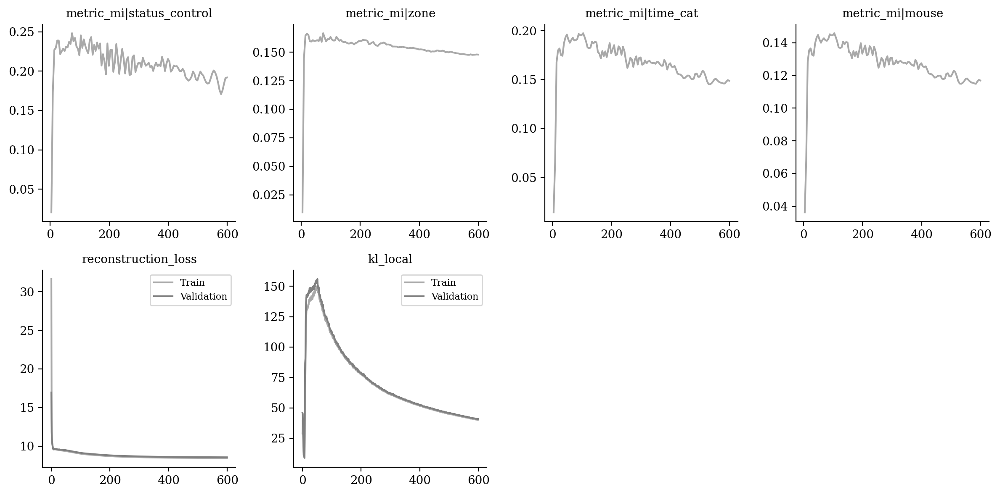

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

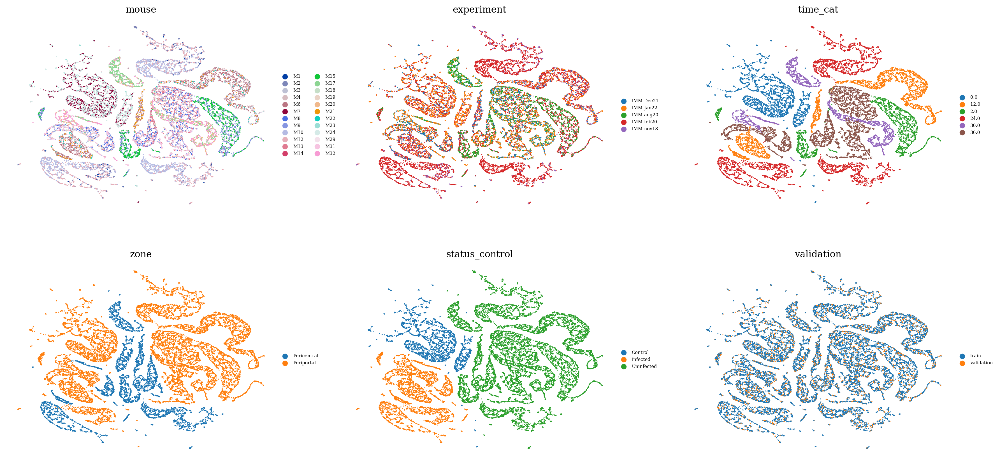

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

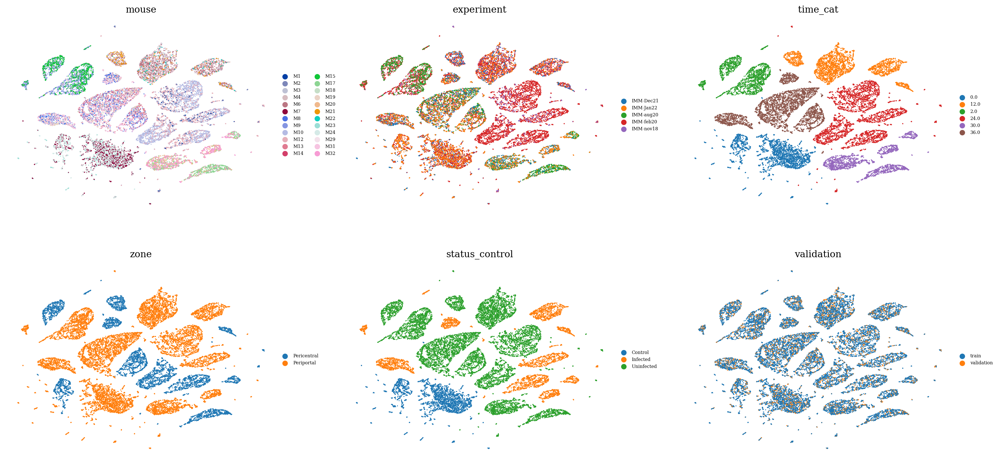

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

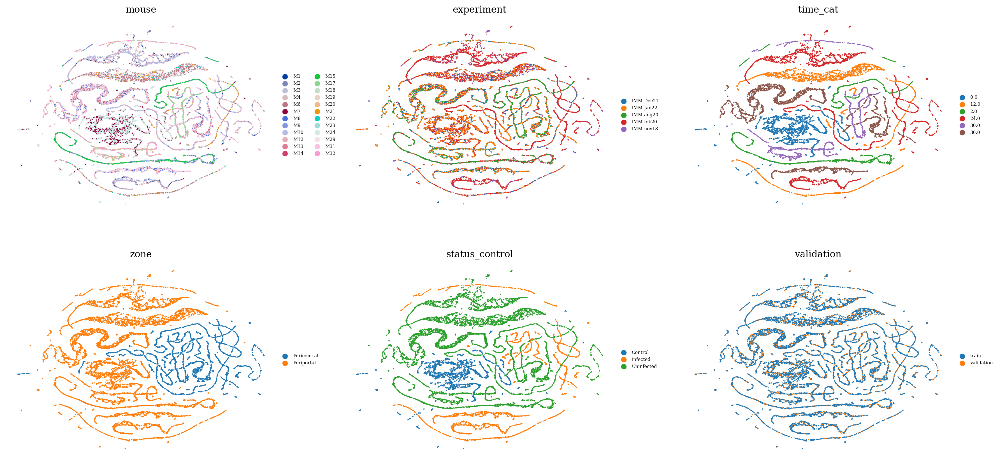

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

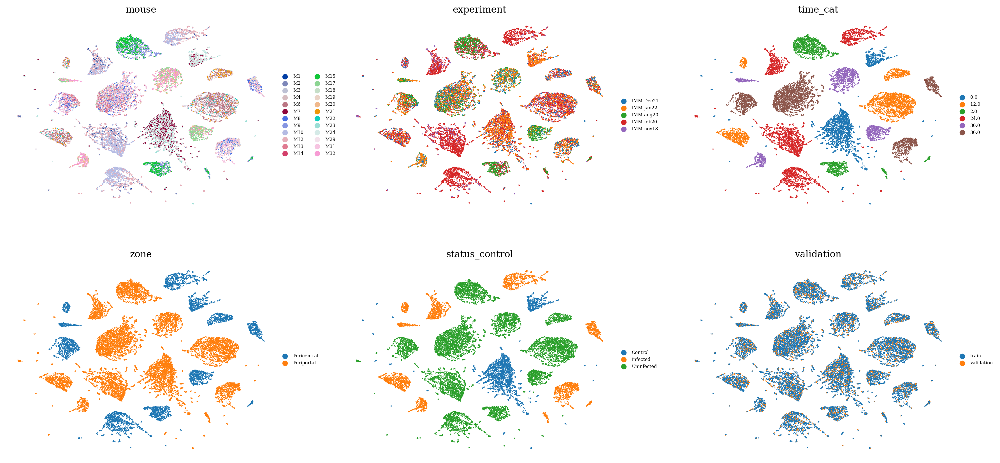

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

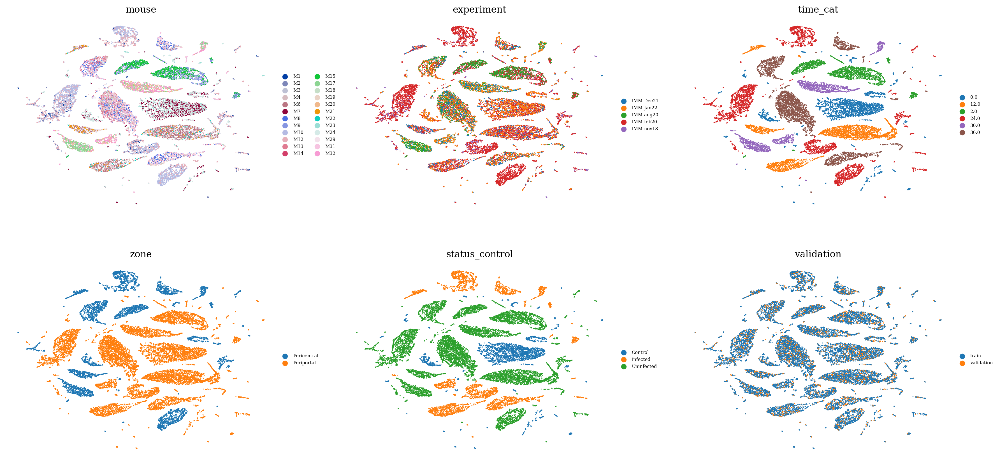

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5323313807909305

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5177859476467045

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9983925888215064,
 ('validation', 'unreserved'): 0.5860686730915771,
 ('train', 'reserved'): 0.996736496485618,
 ('train', 'unreserved'): 0.5671495248377143}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9951179629267233,
 ('validation', 'unreserved'): 0.7163778290776366,
 ('train', 'reserved'): 0.99558429543779,
 ('train', 'unreserved'): 0.6972627095841588}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9909960429409477,
 ('validation', 'unreserved'): 0.6699937731390693,
 ('train', 'reserved'): 0.990951047942357,
 ('train', 'unreserved'): 0.6450688006515948}